In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
import networkx as nx
import warnings

from IPython.display import display, Markdown
from IPython.display import display
from datetime import timedelta
from lingam import VARLiNGAM
from sklearn.preprocessing import StandardScaler

warnings.filterwarnings('ignore')


# Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
sns.set_theme(style="whitegrid", palette="colorblind")
plt.rcParams.update({
    "axes.titlesize": 16,
    "axes.labelsize": 14,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "lines.linewidth": 2.5,
})

# Configuration
FORECAST_HORIZONS = [1, 7, 14, 30]
TEST_SIZE_DAYS = 30  # Last 30 days for testing
RANDOM_STATE = 42
MODEL_DIR = '../models/xgboost_baseline'


# Create model directory if it doesn't exist
os.makedirs(MODEL_DIR, exist_ok=True)

print("✓ Imports complete")

✓ Imports complete


<br> <br> <br>

# Creating and Imporing Datasets

In [2]:
# Edges
df_edges_plant = pd.read_csv("../data/SupplyGraph/Edges/Edges (Plant).csv")
df_edges_product_group = pd.read_csv("../data/SupplyGraph/Edges/Edges (Product Group).csv")
df_edges_product_subgroup = pd.read_csv("../data/SupplyGraph/Edges/Edges (Product Sub-Group).csv")
df_edges_storage_location = pd.read_csv("../data/SupplyGraph/Edges/Edges (Storage Location).csv")

# Nodes
df_nodes_productgroup_and_subgroup = pd.read_csv("../data/SupplyGraph/Nodes/Node Types (Product Group and Subgroup).csv")
df_nodes_plant_and_storage = pd.read_csv("../data/SupplyGraph/Nodes/Nodes Type (Plant & Storage).csv")
df_nodes = pd.read_csv("../data/SupplyGraph/Nodes/Nodes.csv")
# df_nodes_index = pd.read_csv("../data/SupplyGraph/Nodes/NodesIndex.csv")

# Temporal
df_temporal_delivery_to_distributor = pd.read_csv("../data/SupplyGraph/Temporal Data/Unit/Delivery To distributor.csv")
df_temporal_factory_issue = pd.read_csv("../data/SupplyGraph/Temporal Data/Unit/Factory Issue.csv")
df_temporal_production = pd.read_csv("../data/SupplyGraph/Temporal Data/Unit/Production.csv")
df_temporal_sales_order = pd.read_csv("../data/SupplyGraph/Temporal Data/Unit/Sales Order.csv")


# Pivot the datasets
df_temporal_sales_order['Date'] = pd.to_datetime(df_temporal_sales_order['Date'])
df_temporal_sales_order_pivot = df_temporal_sales_order.melt(id_vars='Date', var_name='Product', value_name='Sales').dropna()
df_temporal_production['Date'] = pd.to_datetime(df_temporal_production['Date'])
df_temporal_production_pivot = df_temporal_production.melt(id_vars='Date', var_name='Product', value_name='Production Quantity').dropna()
df_temporal_factory_issue['Date'] = pd.to_datetime(df_temporal_factory_issue['Date'])
df_temporal_factory_issue_pivot = df_temporal_factory_issue.melt(id_vars='Date', var_name='Product', value_name='Factory Issue').dropna()
df_temporal_delivery_to_distributor['Date'] = pd.to_datetime(df_temporal_delivery_to_distributor['Date'])
df_temporal_delivery_to_distributor_pivot = df_temporal_delivery_to_distributor.melt(id_vars='Date', var_name='Product', value_name='Distributor').dropna()

<br> <br> <br>


# Create a Holiday Dataset

In [3]:
holidays_dict = [
    {
        'Date': '2023-02-21',
        'holiday_type': "National Holiday",
        'holiday_name': "Language Martyrs' Day"
    },
    {
        'Date': "2023-03-8",
        'holiday_type': "National Holiday",
        'holiday_name': "Shab e-barat"
    },   
    {
        'Date': "2023-03-17",
        'holiday_type': "National Holiday",
        'holiday_name': "Sheikh Mujibur Rahman's birthday",
    },
    {
        'Date': "2023-03-26",
        'holiday_type': "National Holiday",
        'holiday_name': "Independence Day",
    },
    {
        'Date': "2023-04-14",
        'holiday_type': "National Holiday",
        'holiday_name': "Bengali New Year" 
    },
    {
        'Date': "2023-04-19",
        'holiday_type': "National Holiday",
        'holiday_name': "Shab-e-Qadr"
    },
    {
        'Date': "2023-04-20",
        'holiday_type': "National Holiday",
        'holiday_name': "Eid al-Fitr"
    },
    {
        'Date': "2023-04-21",
        'holiday_type': "National Holiday",
        'holiday_name': "Jumatul Bidah"
    },
    {
        'Date': "2023-04-22",
        'holiday_type': "National Holiday",
        'holiday_name': "Eid al-Fitr"
    },
    {
        'Date': "2023-04-23",
        'holiday_type': "National Holiday",
        'holiday_name': "Eid al-Fitr"
    },
    {
        'Date': "2023-05-01",
        'holiday_type': "National Holiday",
        'holiday_name': "Labour Day"
    },
    {
        'Date': "2023-05-04",
        'holiday_type': "National Holiday",
        'holiday_name': "Buddha Purnima"
    },
    {
        'Date': "2023-06-27",
        'holiday_type': "National Holiday",
        'holiday_name': "Eid-ul-Azha"
    },
    {
        'Date': "2023-06-28",
        'holiday_type': "National Holiday",
        'holiday_name': "Eid-ul-Azha"
    },
    {
        'Date': "2023-06-29",
        'holiday_type': "National Holiday",
        'holiday_name': "Eid-ul-Azha"
    },
    {
        'Date': "2023-06-30",
        'holiday_type': "National Holiday",
        'holiday_name': "Eid-ul-Azha"
    },
    {
        'Date': "2023-07-01",
        'holiday_type': "Not a National Holiday",
        'holiday_name': "Bank Holiday"
    },
    {
        'Date': "2023-07-29",
        'holiday_type': "National Holiday",
        'holiday_name': "Ashura"
    },
    {
        'Date': "2023-08-15",
        'holiday_type': "National Holiday",
        'holiday_name': "National Mourning Day"
    },       
]


# Create dataframe from holidays_dict
df_holidays = pd.DataFrame(holidays_dict)
df_holidays['Date'] = pd.to_datetime(df_holidays['Date']).dt.normalize()

# Optional: rename for clarity
df_holidays = df_holidays.rename(columns={
    'holiday_name': 'holiday_name',
    'holiday_type': 'holiday_type'
})

# Display the newly created holidays dataframe
display(df_holidays)



,Date,holiday_type,holiday_name
0,2023-02-21,National Holiday,Language Martyrs' Day
1,2023-03-08,National Holiday,Shab e-barat
2,2023-03-17,National Holiday,Sheikh Mujibur Rahman's birthday
3,2023-03-26,National Holiday,Independence Day
4,2023-04-14,National Holiday,Bengali New Year
5,2023-04-19,National Holiday,Shab-e-Qadr
6,2023-04-20,National Holiday,Eid al-Fitr
7,2023-04-21,National Holiday,Jumatul Bidah
8,2023-04-22,National Holiday,Eid al-Fitr
9,2023-04-23,National Holiday,Eid al-Fitr


<br> <br> <br>

# Create a Weather Dataset

In [4]:
def load_weather_data(data_dir='../data/Weather Datasets/Station Wise Data', begin_date='2023-01-01', end_date='2023-08-09'):
    
    import glob
    
    # Convert date strings to datetime
    begin_date = pd.to_datetime(begin_date).normalize()
    end_date = pd.to_datetime(end_date).normalize()
    
    # Get all CSV files in the directory
    csv_files = glob.glob(os.path.join(data_dir, '*.csv'))
    
    if len(csv_files) == 0:
        raise FileNotFoundError(f"No CSV files found in {data_dir}")
    
    print(f"Found {len(csv_files)} CSV files")
    print(f"Date range: {begin_date.strftime('%Y-%m-%d')} to {end_date.strftime('%Y-%m-%d')}")
    
    all_dfs = []
    
    for file_path in csv_files:
        # Extract city name from filename (remove path and .csv extension)
        city_name = os.path.basename(file_path).replace('.csv', '')
        
        # Read the CSV
        df = pd.read_csv(file_path)
        
        # Add City column
        df['City'] = city_name
        
        # Check if year, month, day columns exist
        year_col = None
        month_col = None
        day_col = None
        
        for col in df.columns:
            col_lower = col.lower()
            if 'year' in col_lower:
                year_col = col
            elif 'month' in col_lower:
                month_col = col
            elif 'day' in col_lower:
                day_col = col
        
        # Create Date column from year, month, day
        if year_col and month_col and day_col:
            df['Date'] = pd.to_datetime(
                df[[year_col, month_col, day_col]].astype(int).rename(
                    columns={year_col: 'year', month_col: 'month', day_col: 'day'}
                )
            ).dt.normalize()
            
            # Drop original year, month, day columns
            df = df.drop(columns=[year_col, month_col, day_col])
            
            # Filter by date range
            df = df[(df['Date'] >= begin_date) & (df['Date'] <= end_date)]
        else:
            # Try to find existing date column
            date_col = None
            for col in df.columns:
                if 'date' in col.lower():
                    date_col = col
                    break
            
            if date_col is not None:
                df['Date'] = pd.to_datetime(df[date_col]).dt.normalize()
                if date_col != 'Date':
                    df = df.drop(columns=[date_col])
                # Filter by date range
                df = df[(df['Date'] >= begin_date) & (df['Date'] <= end_date)]
            else:
                print(f"Warning: No date columns found in {city_name}.csv")
        
        all_dfs.append(df)
        # print(f"  ✓ Loaded {city_name}: {len(df)} rows")
    
    # Concatenate all dataframes
    df_weather = pd.concat(all_dfs, ignore_index=True)
    
    # Reorder columns to put Date and City first
    cols = df_weather.columns.tolist()
    priority_cols = ['Date', 'City']
    other_cols = [c for c in cols if c not in priority_cols]
    df_weather = df_weather[priority_cols + other_cols]
    
    # print(f"\n✓ Combined weather data: {len(df_weather)} total rows")
    # print(f"  Cities: {df_weather['City'].nunique()}")
    # print(f"  Date range in data: {df_weather['Date'].min().strftime('%Y-%m-%d')} to {df_weather['Date'].max().strftime('%Y-%m-%d')}")
    # print(f"  Columns: {list(df_weather.columns)}")
    
    return df_weather


# Load weather data for 2023 with specific date range
df_weather = load_weather_data(
    data_dir='../data/Weather Datasets/Station Wise Data', 
    begin_date='2023-01-01', 
    end_date='2023-08-09'
)

df_weather.drop(columns="Unnamed: 0", inplace=True)

df_weather

Found 35 CSV files
Date range: 2023-01-01 to 2023-08-09


,Date,City,Station,Rainfall,Sunshine,Humidity,Temperature
0,2023-01-01,Ambaganctg,Ambaganctg,0.0,8.3,65.0,20.4
1,2023-01-02,Ambaganctg,Ambaganctg,0.0,8.9,73.0,19.9
2,2023-01-03,Ambaganctg,Ambaganctg,0.0,7.6,80.0,19.9
3,2023-01-04,Ambaganctg,Ambaganctg,0.0,9.4,75.0,20.4
4,2023-01-05,Ambaganctg,Ambaganctg,0.0,8.0,78.0,19.6
...,...,...,...,...,...,...,...
7730,2023-08-05,Teknaf,Teknaf,0.0,10.7,84.0,28.8
7731,2023-08-06,Teknaf,Teknaf,2.0,7.2,80.0,29.0
7732,2023-08-07,Teknaf,Teknaf,0.0,7.7,83.0,28.7
7733,2023-08-08,Teknaf,Teknaf,36.0,0.0,92.0,27.5


In [5]:
# Filter weather data for Ambaganctg (case-insensitive)
city_name = "Dhaka" # 'Ambaganctg', "Dhaka"
df_weather[df_weather['City'].astype(str).str.strip().str.lower() == city_name.lower()]

,Date,City,Station,Rainfall,Sunshine,Humidity,Temperature
1989,2023-01-01,Dhaka,Dhaka,0.0,4.0,81.0,17.9
1990,2023-01-02,Dhaka,Dhaka,0.0,5.5,71.0,19.1
1991,2023-01-03,Dhaka,Dhaka,0.0,0.0,87.0,16.2
1992,2023-01-04,Dhaka,Dhaka,0.0,0.0,91.0,14.8
1993,2023-01-05,Dhaka,Dhaka,0.0,1.3,86.0,15.2
...,...,...,...,...,...,...,...
2205,2023-08-05,Dhaka,Dhaka,55.0,5.7,81.0,29.4
2206,2023-08-06,Dhaka,Dhaka,5.0,5.0,91.0,27.8
2207,2023-08-07,Dhaka,Dhaka,18.0,4.2,95.0,27.4
2208,2023-08-08,Dhaka,Dhaka,54.0,7.1,91.0,27.3


<br> <br> <br>

# Create an Event Dataset

In [6]:
df_events = pd.read_csv("../data/BangladeshEvents/event.csv",  parse_dates=["date"])
df_events

,date,category,name,type,scope_or_location,typical_max_temp_C,typical_min_temp_C,typical_rain_mm,weather_basis,impact_on_supply_chain,notes,source_links
0,2023-01-01,school_university,Start of primary & secondary school academic y...,Academic session start,Nationwide,25.4,12.7,7.7,Dhaka Jan climate normals,"School-related demand (uniforms, books, transp...",Academic year in Bangladesh generally runs Jan...,https://dpe.gov.bd/|https://www.unesco.org/en/...
1,2023-01-13,cultural_event,Bishwa Ijtema 2023 – Phase 1 (13–15 Jan),Mass religious congregation (Tablighi Jamaat),Tongi near Dhaka,25.4,12.7,7.7,Dhaka Jan climate normals,Huge temporary population inflow; heavy pressu...,Event spans 3 days; treat as event window in m...,https://www.thedailystar.net/tags/biswa-ijtema
2,2023-01-20,cultural_event,Bishwa Ijtema 2023 – Phase 2 (20–22 Jan),Mass religious congregation,Tongi near Dhaka,25.4,12.7,7.7,Dhaka Jan climate normals,Similar logistical pattern to Phase 1: congest...,Use as second event window close to Dhaka mark...,https://www.thedailystar.net/tags/biswa-ijtema
3,2023-02-14,cultural_event,Pohela Falgun & Valentine's Day,Cultural festival,Urban centres (esp. Dhaka),28.1,15.5,28.9,Dhaka Feb climate normals,"High footfall in parks, campuses, restaurants;...",Good candidate for positive demand shock in ur...,https://www.thedailystar.net/news/bangladesh/n...
4,2023-02-21,national_holiday,Language Martyrs' Day / International Mother L...,Government/National holiday,Nationwide,28.1,15.5,28.9,Dhaka Feb climate normals,Processions and official ceremonies; governmen...,Can model as national_holiday dummy; demand ef...,https://www.officeholidays.com/countries/bangl...
5,2023-03-08,religious_holiday,Shab-e-Barat,Government holiday,Nationwide,32.5,20.4,65.8,Dhaka Mar climate normals,Night prayers and visits to cemeteries; some b...,Mainly timing effect on working hours and urba...,https://calendarific.com/holiday/bangladesh/sh...
6,2023-03-17,national_holiday,Sheikh Mujibur Rahman's Birthday & National Ch...,Government/National holiday,Nationwide,32.5,20.4,65.8,Dhaka Mar climate normals,Government offices closed; ceremonies and gath...,Include as national_holiday dummy.,https://www.officeholidays.com/countries/bangl...
7,2023-03-23,religious_period,Start of Ramadan 1444 (approx.),Religious fasting month,Nationwide,32.5,20.4,65.8,Dhaka Mar climate normals,"Shift of consumption to evening/night (iftar, ...",Model as month-long behavioural regime change ...,https://www.islamic-relief.org.uk/resources/is...
8,2023-03-26,national_holiday,Independence and National Day,Government/National holiday,Nationwide,32.5,20.4,65.8,Dhaka Mar climate normals,Large rallies and parades; government offices ...,Important national_holiday dummy with possible...,https://www.officeholidays.com/countries/bangl...
9,2023-04-14,cultural_holiday,Bengali New Year (Pohela Boishakh),Government holiday / Cultural new year,Nationwide (strongest in cities),33.7,23.6,156.0,Dhaka Apr climate normals,One of the biggest cultural festivals; very hi...,Strong positive demand shock in retail; possib...,https://www.timeanddate.com/holidays/banglades...


<br> <br> <br>

# Create a Currency Exchange Dataset

In [7]:
df_currency_exchange = pd.read_csv("../data/CurrencyExchange/Bangladeshi_Taka_to_USD.csv",  parse_dates=["Date"])
df_currency_exchange

,Date,BDT_USD
0,2023-01-02 23:58:00,104.7776
1,2023-01-03 23:58:00,101.6990
2,2023-01-04 23:58:00,101.9814
3,2023-01-05 23:58:00,102.0143
4,2023-01-06 23:58:00,102.1778
...,...,...
315,2023-12-25 23:58:00,108.3107
316,2023-12-27 23:58:00,108.0956
317,2023-12-28 23:58:00,108.6817
318,2023-12-29 23:58:00,108.1286


<br> <br> <br>

#  Calculate the Coefficient of Variation (CV)

In [8]:
def calculate_product_stats(df, group_col='Product', agg_col='Sales'):
    stats = (
        df.groupby(group_col)
          .agg(
              total_units=(agg_col, 'sum'),
              days_with_activity=(agg_col, lambda x: (x > 0).sum()),
              num_days=(agg_col, 'count'),
              avg_daily=(agg_col, 'mean'),
              std_daily=(agg_col, 'std')
          )
    )
    
    stats['activity_frequency'] = stats['days_with_activity'] / stats['num_days']    
    stats['cv'] = stats['std_daily'] / stats['avg_daily']
    # stats['cv'] = stats['cv'].replace([np.inf, -np.inf], np.nan)
    
    # Reset index to make group_col a regular column
    stats = stats.reset_index()
    
    return stats



# Example usage for all temporal dataframes:

# Sales statistics
sales_stats = calculate_product_stats(df_temporal_sales_order_pivot, group_col='Product', agg_col='Sales')
display(Markdown("**Sales Statistics**"))
display(sales_stats)

**Sales Statistics**

,Product,total_units,days_with_activity,num_days,avg_daily,std_daily,activity_frequency,cv
0,AT5X5K,1.782512e+05,174,221,806.566516,938.839092,0.787330,1.163995
1,ATN01K24P,6.393748e+05,179,221,2893.098569,2701.549761,0.809955,0.933791
2,ATN02K12P,1.370076e+05,177,221,619.943831,615.530467,0.800905,0.992881
3,ATPA1K24P,3.100000e+01,1,221,0.140271,2.085286,0.004525,14.866069
4,ATPPCH5X5K,1.000000e+01,1,221,0.045249,0.672673,0.004525,14.866069
5,ATWWP001K24P,9.223728e+03,159,221,41.736327,52.292598,0.719457,1.252928
6,ATWWP002K12P,3.733000e+03,125,221,16.891401,39.055150,0.565611,2.312132
7,EEA200G24P,5.000000e+00,1,221,0.022624,0.336336,0.004525,14.866069
8,EEA500G12P,1.150000e+02,3,221,0.520362,5.250610,0.013575,10.090302
9,MAC1K25P,8.880000e+02,30,221,4.018100,14.922212,0.135747,3.713749


In [9]:
def classify_speed_segment(stats_df, volume_col='total_units', frequency_col='activity_frequency',  q_high=0.8, q_mid=0.5, freq_threshold=0.5):
    
    df = stats_df.copy()
    
    # Calculate quantiles
    q80 = df[volume_col].quantile(q_high) # e.g. 153888.006 = this value changes based on stats_df
    q50 = df[volume_col].quantile(q_mid)  # e.g. 36836.0001 = this value changes based on stats_df
    print(f"q80 = {q80}")
    print(f"q50 = {q50}")
    print(f"Volume Column is: {volume_col}")
    print(f"if ({volume_col} >= {q80}) and ({frequency_col} >= {freq_threshold}) => `Fast`\nelif {volume_col} >= {q50} => `Medium`\nelse => `Slow`")
    print("\n\n")

    # Classification function
    def classify(row):
        if row[volume_col] >= q80 and row[frequency_col] > freq_threshold: # if total_unit > 153888.006 and "activity_frequency (0.7873)" > 0.4 (0.5=default value) 
            return 'Fast'
        elif row[volume_col] >= q50:
            return 'Medium'
        else:
            return 'Slow'
    
    # Apply classification
    df['speed_segment'] = df.apply(classify, axis=1)
    
    return df



# Classify sales statistics
df_stats_classified = classify_speed_segment(
    sales_stats, 
    volume_col='total_units',
    q_high=0.75,  # Top 25% instead of 20%
    q_mid=0.5,
    freq_threshold=0.4  # Lower frequency threshold
)

df_stats_classified

q80 = 153888.006
q50 = 36836.00000000001
Volume Column is: total_units
if (total_units >= 153888.006) and (activity_frequency >= 0.4) => `Fast`
elif total_units >= 36836.00000000001 => `Medium`
else => `Slow`





,Product,total_units,days_with_activity,num_days,avg_daily,std_daily,activity_frequency,cv,speed_segment
0,AT5X5K,1.782512e+05,174,221,806.566516,938.839092,0.787330,1.163995,Fast
1,ATN01K24P,6.393748e+05,179,221,2893.098569,2701.549761,0.809955,0.933791,Fast
2,ATN02K12P,1.370076e+05,177,221,619.943831,615.530467,0.800905,0.992881,Medium
3,ATPA1K24P,3.100000e+01,1,221,0.140271,2.085286,0.004525,14.866069,Slow
4,ATPPCH5X5K,1.000000e+01,1,221,0.045249,0.672673,0.004525,14.866069,Slow
5,ATWWP001K24P,9.223728e+03,159,221,41.736327,52.292598,0.719457,1.252928,Slow
6,ATWWP002K12P,3.733000e+03,125,221,16.891401,39.055150,0.565611,2.312132,Slow
7,EEA200G24P,5.000000e+00,1,221,0.022624,0.336336,0.004525,14.866069,Slow
8,EEA500G12P,1.150000e+02,3,221,0.520362,5.250610,0.013575,10.090302,Slow
9,MAC1K25P,8.880000e+02,30,221,4.018100,14.922212,0.135747,3.713749,Slow



<br> <br> <br>

# Identify Product

In [10]:
def get_products_by_speed_segment(df_classified, mover='Fast'):
    """
    Get products filtered by speed segment.
    
    Args:
        df_classified: pandas.DataFrame - classified dataframe with 'speed_segment' column
        mover: str or list - speed segment(s) to filter by
               Can be: 'Fast', 'Medium', 'Slow', 'all'
               Or a list: ['Fast', 'Medium'], ['Fast', 'Slow'], etc.
               
    Returns:
        list: List of unique product names matching the specified segment(s)
    """
    valid_segments = ['Fast', 'Medium', 'Slow']
    
    # Handle 'all' case
    if mover == 'all':
        products = df_classified['Product'].dropna().drop_duplicates().tolist()
        print(f"✓ All products: {len(products)} products")
        return products
    
    # Convert single string to list for uniform processing
    if isinstance(mover, str):
        mover = [mover]
    
    # Validate input
    invalid_segments = [m for m in mover if m not in valid_segments]
    if invalid_segments:
        raise ValueError(f"Invalid segment(s): {invalid_segments}. Valid options: {valid_segments}")
    
    # Filter by speed segment(s)
    mask = df_classified['speed_segment'].isin(mover)
    products = df_classified.loc[mask, 'Product'].dropna().drop_duplicates().tolist()
    
    # Print summary
    print(f"\n{'='*70}")
    print(f"PRODUCTS BY SPEED SEGMENT: {mover}")
    print(f"{'='*70}")
    print(f"Total products: {len(products)}")
    
    # Show breakdown by segment
    for segment in mover:
        segment_count = df_classified[df_classified['speed_segment'] == segment]['Product'].nunique()
        print(f"  - {segment}: {segment_count} products")
    
    # Display product details
    for i, product in enumerate(products, 1):
        stats = df_classified[df_classified['Product'] == product].iloc[0]
        print(f"{i:2d}. {product:15s} | Segment: {stats['speed_segment']:6s} | Volume: {stats['total_units']:>10,.0f} | CV: {stats['cv']:.3f} | Activity: {stats['activity_frequency']:.1%}")
    
    return products


# Example usage:

# Get Fast movers only
# FAST_MOVERS = get_products_by_speed_segment(df_stats_classified, mover='Fast')

# Get Medium movers only
# MEDIUM_MOVERS = get_products_by_speed_segment(df_stats_classified, mover='Medium')

# Get Slow movers only
# SLOW_MOVERS = get_products_by_speed_segment(df_stats_classified, mover='Slow')

# Get Fast and Medium movers
# FAST_AND_MEDIUM = get_products_by_speed_segment(df_stats_classified, mover=['Fast', 'Medium'])

# Get all products
ALL_PRODUCTS = get_products_by_speed_segment(df_stats_classified, mover='all')

✓ All products: 41 products


<br> <br> <br>

# Prepare Base Dataset - Merging Dataframes

In [11]:
# Filter for fast movers
MOVERS = ALL_PRODUCTS

# Filter for movers
df_sales_mover = df_temporal_sales_order[['Date'] + MOVERS].copy()
df_production_mover = df_temporal_production[['Date'] + [p for p in MOVERS if p in df_temporal_production.columns]].copy()
df_factory_issue_mover = df_temporal_factory_issue[['Date'] + [p for p in MOVERS if p in df_temporal_factory_issue.columns]].copy()
df_delivery_mover = df_temporal_delivery_to_distributor[['Date'] + [p for p in MOVERS if p in df_temporal_delivery_to_distributor.columns]].copy()


# Pivot to long format
df_sales_long = df_sales_mover.melt(id_vars='Date', var_name='Product', value_name='Sales')
df_production_long = df_production_mover.melt(id_vars='Date', var_name='Product', value_name='Production')
df_factory_issue_long = df_factory_issue_mover.melt(id_vars='Date', var_name='Product', value_name='Factory_Issue')
df_delivery_long = df_delivery_mover.melt(id_vars='Date', var_name='Product', value_name='Delivery')

# Merge all temporal data
df_base = df_sales_long.merge(df_production_long, on=['Date', 'Product'], how='left')
df_base = df_base.merge(df_factory_issue_long, on=['Date', 'Product'], how='left')
df_base = df_base.merge(df_delivery_long, on=['Date', 'Product'], how='left')

# Fill NaN with 0 (no activity)
df_base = df_base.fillna(0)

# Sort by Product and Date
df_base = df_base.sort_values(['Product', 'Date']).reset_index(drop=True)

# Add Product, Group and Sub-Group
df_meta_filtered = df_nodes_productgroup_and_subgroup.rename(columns={'Node': 'Product'})
df_base = df_base.merge(df_meta_filtered[['Product', 'Group', 'Sub-Group']], on='Product', how='left')

print(f"Base dataset shape: {df_base.shape}")
print(f"\nColumns: {list(df_base.columns)}")
print(f"\nDate range: {df_base['Date'].min()} to {df_base['Date'].max()}")
print(f"Number of products: {df_base['Product'].nunique()}")
print(f"Total records: {len(df_base):,}")

df_base = df_base.drop_duplicates().reset_index(drop=True)
df_base

Base dataset shape: (9282, 8)

Columns: ['Date', 'Product', 'Sales', 'Production', 'Factory_Issue', 'Delivery', 'Group', 'Sub-Group']

Date range: 2023-01-01 00:00:00 to 2023-08-09 00:00:00
Number of products: 41
Total records: 9,282


,Date,Product,Sales,Production,Factory_Issue,Delivery,Group,Sub-Group
0,2023-01-01,AT5X5K,2642.0,1500,970.0,707.0,A,AT
1,2023-01-02,AT5X5K,1070.0,1500,1720.0,2317.0,A,AT
2,2023-01-03,AT5X5K,2355.0,2000,2964.0,2215.6,A,AT
3,2023-01-04,AT5X5K,909.8,2000,2265.0,2439.0,A,AT
4,2023-01-05,AT5X5K,3504.0,2000,1100.0,735.8,A,AT
...,...,...,...,...,...,...,...,...
9056,2023-08-05,SOS500M24P,109.0,1203,1709.0,1477.0,S,SOS
9057,2023-08-06,SOS500M24P,2897.0,1000,1735.0,1179.0,S,SOS
9058,2023-08-07,SOS500M24P,2385.0,2000,1675.0,2506.0,S,SOS
9059,2023-08-08,SOS500M24P,0.0,1024,445.0,500.0,S,SOS


In [12]:
# Prepare dataframes for merging

# 1. Filter weather data for Dhaka only
df_weather_dhaka = df_weather[df_weather['City'].str.lower() == 'dhaka'].copy()
df_weather_dhaka = df_weather_dhaka.drop(columns=['City'])  # Remove City column since it's always Dhaka

# 2. Prepare events dataframe (rename 'date' to 'Date' for consistency)
df_events_clean = df_events.copy()
df_events_clean = df_events_clean.rename(columns={'date': 'Date'})
df_events_clean['Date'] = pd.to_datetime(df_events_clean['Date']).dt.normalize()

# 3. Prepare currency exchange dataframe
df_currency_clean = df_currency_exchange.copy()
df_currency_clean['Date'] = pd.to_datetime(df_currency_clean['Date']).dt.normalize()

# 4. Prepare holidays dataframe
df_holidays_clean = df_holidays.copy()
df_holidays_clean['Date'] = pd.to_datetime(df_holidays_clean['Date']).dt.normalize()

# 5. Ensure df_base Date is normalized
df_base['Date'] = pd.to_datetime(df_base['Date']).dt.normalize()

# Merge all dataframes
print("Merging dataframes...")

# Merge with holidays
df_merged = df_base.merge(df_holidays_clean, on='Date', how='left')
print(f"  ✓ Merged with holidays: {df_merged.shape}")

# Merge with weather (Dhaka only)
df_merged = df_merged.merge(df_weather_dhaka, on='Date', how='left')
print(f"  ✓ Merged with weather (Dhaka): {df_merged.shape}")

# Merge with events
df_merged = df_merged.merge(df_events_clean, on='Date', how='left')
print(f"  ✓ Merged with events: {df_merged.shape}")

# Merge with currency exchange
df_merged = df_merged.merge(df_currency_clean, on='Date', how='left')
print(f"  ✓ Merged with currency exchange: {df_merged.shape}")

# Fill NaN for categorical columns
if 'Holiday' in df_merged.columns:
    df_merged['Holiday'] = df_merged['Holiday'].fillna('no_holiday')
if 'category' in df_merged.columns:
    df_merged['category'] = df_merged['category'].fillna('no_event')

df_merged

df_merged.drop(columns=["name", "type", "typical_max_temp_C", "typical_min_temp_C", "weather_basis", "impact_on_supply_chain", "notes", "source_links"], inplace=True)

Merging dataframes...
  ✓ Merged with holidays: (9061, 10)
  ✓ Merged with weather (Dhaka): (9061, 15)
  ✓ Merged with events: (9061, 26)
  ✓ Merged with currency exchange: (9061, 27)


In [13]:
df_merged

,Date,Product,Sales,Production,Factory_Issue,Delivery,Group,Sub-Group,holiday_type,holiday_name,Station,Rainfall,Sunshine,Humidity,Temperature,category,scope_or_location,typical_rain_mm,BDT_USD
0,2023-01-01,AT5X5K,2642.0,1500,970.0,707.0,A,AT,NaN,NaN,Dhaka,0.0,4.0,81.0,17.9,school_university,Nationwide,7.7,NaN
1,2023-01-02,AT5X5K,1070.0,1500,1720.0,2317.0,A,AT,NaN,NaN,Dhaka,0.0,5.5,71.0,19.1,no_event,NaN,NaN,104.7776
2,2023-01-03,AT5X5K,2355.0,2000,2964.0,2215.6,A,AT,NaN,NaN,Dhaka,0.0,0.0,87.0,16.2,no_event,NaN,NaN,101.6990
3,2023-01-04,AT5X5K,909.8,2000,2265.0,2439.0,A,AT,NaN,NaN,Dhaka,0.0,0.0,91.0,14.8,no_event,NaN,NaN,101.9814
4,2023-01-05,AT5X5K,3504.0,2000,1100.0,735.8,A,AT,NaN,NaN,Dhaka,0.0,1.3,86.0,15.2,no_event,NaN,NaN,102.0143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9056,2023-08-05,SOS500M24P,109.0,1203,1709.0,1477.0,S,SOS,NaN,NaN,Dhaka,55.0,5.7,81.0,29.4,weather_event,Chattogram division & south-east,316.5,106.5524
9057,2023-08-06,SOS500M24P,2897.0,1000,1735.0,1179.0,S,SOS,NaN,NaN,Dhaka,5.0,5.0,91.0,27.8,no_event,NaN,NaN,106.6636
9058,2023-08-07,SOS500M24P,2385.0,2000,1675.0,2506.0,S,SOS,NaN,NaN,Dhaka,18.0,4.2,95.0,27.4,no_event,NaN,NaN,107.6734
9059,2023-08-08,SOS500M24P,0.0,1024,445.0,500.0,S,SOS,NaN,NaN,Dhaka,54.0,7.1,91.0,27.3,no_event,NaN,NaN,107.7798


In [14]:
df_merged.to_csv("../causality/df_merged.csv")

<br> <br>

# Causal Graph 

## Create Causal Graph

In [15]:
def generate_causal_graph_VARLiNGAM(df_merged, lag=1, criterion='bic', target_col='Sales', variance_threshold=0.01, correlation_threshold=0.95, max_features=20):
    """
    Generate a causal graph from time series data using VARLiNGAM.
    
    Parameters:
    -----------
    df_merged : pd.DataFrame
        The merged dataset with all features
    lag : int, default=1
        Maximum lag order for VAR model (actual lag may differ if criterion-based selection is used)
    criterion : str, default='bic'
        Criterion for model selection ('aic', 'bic', 'hqic'). Note: may auto-select different lag.
    target_col : str, default='Sales'
        The target variable name
    variance_threshold : float, default=0.01
        Minimum variance required for a feature to be included
    correlation_threshold : float, default=0.95
        Maximum correlation allowed between features
    max_features : int, default=20
        Maximum number of features to include for computational stability
    
    Returns:
    --------
    nx.DiGraph
        Directed graph representing causal relationships
    dict
        Additional information about the causal discovery process
    """
    
    print(f"\n{'='*60}")
    print(f"VARLINGAM CAUSAL DISCOVERY")
    print(f"{'='*60}")
    print(f"Configuration:")
    print(f"  - Max lag: {lag}")
    print(f"  - Criterion: {criterion}")
    print(f"  - Target: {target_col}")
    print(f"  - Dataset shape: {df_merged.shape}")
    
    # =========================================================================
    # STEP 1: SELECT NUMERICAL FEATURES
    # =========================================================================
    exclude_cols = ['Date', 'Product', 'Sub-Group', 'Group']
    numerical_cols = [col for col in df_merged.select_dtypes(include=[np.number]).columns 
                     if col not in exclude_cols]
    
    print(f"\nSTEP 1: Feature Selection")
    print(f"  - Initial numerical variables: {len(numerical_cols)}")
    
    if target_col not in numerical_cols:
        raise ValueError(f"Target column '{target_col}' not found in numerical columns")
    
    # =========================================================================
    # STEP 2: PREPARE DATA
    # =========================================================================
    ts_data = df_merged[numerical_cols].copy()
    
    # Handle missing and infinite values
    ts_data = ts_data.fillna(0)
    ts_data = ts_data.replace([np.inf, -np.inf], 0)
    
    print(f"\nSTEP 2: Data Cleaning")
    print(f"  - Filled NaN and Inf values")
    
    # =========================================================================
    # STEP 3: REMOVE LOW-VARIANCE FEATURES
    # =========================================================================
    print(f"\nSTEP 3: Variance Filtering")
    variances = ts_data.var()
    low_var_cols = variances[variances < variance_threshold].index.tolist()
    
    # Always keep target variable
    if target_col in low_var_cols:
        low_var_cols.remove(target_col)
    
    ts_data = ts_data.drop(columns=low_var_cols)
    print(f"  - Removed {len(low_var_cols)} low-variance features")
    if low_var_cols:
        print(f"    Removed: {low_var_cols}")
    
    # =========================================================================
    # STEP 4: REMOVE HIGHLY CORRELATED FEATURES
    # =========================================================================
    print(f"\nSTEP 4: Correlation Filtering")
    remaining_cols = ts_data.columns.tolist()
    
    if len(remaining_cols) > 1:
        corr_matrix = ts_data.corr().abs()
        upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
        
        to_drop = set()
        for col in upper.columns:
            if col == target_col:
                continue
            high_corr_features = upper.index[upper[col] > correlation_threshold].tolist()
            for hc_feature in high_corr_features:
                if hc_feature != target_col:
                    to_drop.add(hc_feature)
        
        ts_data = ts_data.drop(columns=list(to_drop))
        print(f"  - Removed {len(to_drop)} highly correlated features (r > {correlation_threshold})")
        if to_drop:
            print(f"    Removed: {list(to_drop)}")
    
    # =========================================================================
    # STEP 5: LIMIT TO MAX FEATURES
    # =========================================================================
    print(f"\nSTEP 5: Feature Limit")
    remaining_cols = ts_data.columns.tolist()
    
    if len(remaining_cols) > max_features:
        # Keep target and top correlated features
        correlations = ts_data.corr()[target_col].abs().drop(target_col).sort_values(ascending=False)
        top_features = correlations.head(max_features - 1).index.tolist()
        top_features.append(target_col)
        ts_data = ts_data[top_features]
        print(f"  - Selected top {max_features} features (based on correlation with {target_col})")
    else:
        print(f"  - All {len(remaining_cols)} features retained (under limit of {max_features})")
    
    final_cols = ts_data.columns.tolist()
    print(f"\nFinal feature set: {len(final_cols)} variables")
    print(f"  {final_cols}")
    
    if len(final_cols) < 2:
        raise ValueError("Need at least 2 variables for causal analysis")
    
    # =========================================================================
    # STEP 6: STANDARDIZE DATA
    # =========================================================================
    print(f"\nSTEP 6: Standardization")
    scaler = StandardScaler()
    ts_scaled = scaler.fit_transform(ts_data)
    ts_scaled = pd.DataFrame(ts_scaled, columns=ts_data.columns, index=ts_data.index)
    print(f"  - Standardized time series shape: {ts_scaled.shape}")
    
    # =========================================================================
    # STEP 7: FIT VARLINGAM MODEL
    # =========================================================================
    print(f"\nSTEP 7: Fitting VARLiNGAM")
    print(f"  - Attempting with max_lag={lag}, criterion={criterion}")
    
    model = None
    fitted_successfully = False
    
    # Try fitting with requested lag
    try:
        model = VARLiNGAM(lags=lag, criterion=criterion)
        model.fit(ts_scaled.values)
        fitted_successfully = True
        print(f"  ✓ Model fitted successfully")
    except np.linalg.LinAlgError as e:
        print(f"  ✗ LinAlgError with lag={lag}: {str(e)}")
        
        # Try with progressively smaller lags
        for new_lag in range(lag-1, 0, -1):
            print(f"  - Retrying with lag={new_lag}")
            try:
                model = VARLiNGAM(lags=new_lag, criterion=criterion)
                model.fit(ts_scaled.values)
                fitted_successfully = True
                print(f"  ✓ Model fitted successfully with lag={new_lag}")
                break
            except np.linalg.LinAlgError:
                continue
        
        # If still failing, try with fewer features
        if not fitted_successfully and len(final_cols) > 10:
            print(f"  - Reducing feature set to top 10 most correlated with {target_col}")
            correlations = ts_data.corr()[target_col].abs().drop(target_col).sort_values(ascending=False)
            top_features = correlations.head(9).index.tolist()
            top_features.append(target_col)
            
            ts_data_reduced = ts_data[top_features]
            ts_scaled_reduced = scaler.fit_transform(ts_data_reduced)
            ts_scaled_reduced = pd.DataFrame(ts_scaled_reduced, 
                                            columns=ts_data_reduced.columns, 
                                            index=ts_data_reduced.index)
            
            try:
                model = VARLiNGAM(lags=1, criterion=criterion)
                model.fit(ts_scaled_reduced.values)
                ts_scaled = ts_scaled_reduced
                final_cols = ts_data_reduced.columns.tolist()
                fitted_successfully = True
                print(f"  ✓ Model fitted with reduced feature set ({len(final_cols)} variables)")
            except np.linalg.LinAlgError:
                pass
    
    if not fitted_successfully or model is None:
        raise ValueError("Failed to fit VARLiNGAM model even with reduced features and lags")
    
    # =========================================================================
    # STEP 8: EXTRACT MODEL STRUCTURE
    # =========================================================================
    print(f"\nSTEP 8: Extracting Causal Structure")
    
    # Determine actual number of lags used by the model
    actual_n_lags = 0
    if hasattr(model, 'adjacency_matrices_') and model.adjacency_matrices_ is not None:
        actual_n_lags = len(model.adjacency_matrices_)
    
    print(f"  - Model returned {actual_n_lags} lag matrices")
    print(f"  - Variables in model: {len(final_cols)}")
    
    # Extract causal order
    causal_order = None
    if hasattr(model, 'causal_order_') and model.causal_order_ is not None:
        if isinstance(model.causal_order_, list):
            causal_order = model.causal_order_
        else:
            causal_order = model.causal_order_.tolist()
    
    # =========================================================================
    # STEP 9: BUILD NETWORKX GRAPH
    # =========================================================================
    print(f"\nSTEP 9: Building Causal Graph")
    G = nx.DiGraph()
    
    # Add current time nodes
    for var in final_cols:
        G.add_node(var, node_type='current', time='t')
    
    # Add lagged nodes based on actual model output
    for l in range(1, actual_n_lags + 1):
        for var in final_cols:
            G.add_node(f"{var}_lag_{l}", node_type='lagged', time=f't-{l}')
    
    print(f"  - Created {len(final_cols)} current nodes")
    print(f"  - Created {len(final_cols) * actual_n_lags} lagged nodes")
    
    # Add lagged edges (X(t-k) -> Y(t))
    edge_count = 0
    if hasattr(model, 'adjacency_matrices_') and model.adjacency_matrices_ is not None:
        for lag_idx, adj_matrix in enumerate(model.adjacency_matrices_):
            current_lag = lag_idx + 1
            for i in range(len(final_cols)):
                for j in range(len(final_cols)):
                    weight = adj_matrix[i, j]
                    if abs(weight) > 1e-6:  # Threshold for non-zero
                        from_node = f"{final_cols[j]}_lag_{current_lag}"
                        to_node = final_cols[i]
                        G.add_edge(from_node, to_node, 
                                 weight=weight, 
                                 lag=current_lag,
                                 edge_type='lagged')
                        edge_count += 1
    
    print(f"  - Added {edge_count} lagged edges")
    
    # Add instantaneous edges (X(t) -> Y(t))
    inst_edge_count = 0
    if hasattr(model, 'adjacency_matrix_') and model.adjacency_matrix_ is not None:
        inst_matrix = model.adjacency_matrix_
        for i in range(len(final_cols)):
            for j in range(len(final_cols)):
                weight = inst_matrix[i, j]
                if abs(weight) > 1e-6:
                    G.add_edge(final_cols[j], final_cols[i], 
                             weight=weight, 
                             lag=0,
                             edge_type='instantaneous')
                    inst_edge_count += 1
    
    print(f"  - Added {inst_edge_count} instantaneous edges")
    
    # =========================================================================
    # STEP 10: ANALYZE TARGET VARIABLE
    # =========================================================================
    print(f"\nSTEP 10: Analyzing '{target_col}'")
    
    # Get all edges pointing to target
    target_edges = [(u, v, d) for u, v, d in G.edges(data=True) if v == target_col]
    target_edges_sorted = sorted(target_edges, key=lambda x: abs(x[2]['weight']), reverse=True)
    
    print(f"  - Found {len(target_edges)} direct causes of '{target_col}'")
    print(f"\n  Top 10 causes:")
    for i, (u, v, d) in enumerate(target_edges_sorted[:10]):
        edge_type = d.get('edge_type', 'unknown')
        print(f"    {i+1:2d}. {u:25s} -> {v:15s} | weight: {d['weight']:8.4f} | lag: {d['lag']} | type: {edge_type}")
    
    # =========================================================================
    # STEP 11: PREPARE OUTPUT
    # =========================================================================
    info = {
        'method': 'VARLiNGAM',
        'requested_lag': lag,
        'actual_n_lags': actual_n_lags,
        'criterion': criterion,
        'target_col': target_col,
        'n_variables': len(final_cols),
        'n_nodes': G.number_of_nodes(),
        'n_edges': G.number_of_edges(),
        'n_lagged_edges': edge_count,
        'n_instantaneous_edges': inst_edge_count,
        'variables': final_cols,
        'causal_order': causal_order,
        'target_causes': target_edges_sorted,
        'removed_low_variance': low_var_cols if 'low_var_cols' in locals() else [],
        'removed_high_correlation': list(to_drop) if 'to_drop' in locals() else []
    }
    
    print(f"\n{'='*60}")
    print(f"SUMMARY")
    print(f"{'='*60}")
    print(f"Graph Structure:")
    print(f"  - Nodes: {info['n_nodes']}")
    print(f"  - Edges: {info['n_edges']} ({info['n_instantaneous_edges']} instantaneous + {info['n_lagged_edges']} lagged)")
    print(f"  - Variables: {info['n_variables']}")
    print(f"  - Lags used: {info['actual_n_lags']}")
    
    if causal_order is not None:
        print(f"\nCausal Order:")
        print(f"  {[final_cols[i] for i in causal_order]}")
    
    print(f"{'='*60}\n")
    
    return G, info




## Visualize Causal Graph

In [16]:
def visualize_causal_graph(G, graph_info, target_col='Sales', 
                          figsize=(20, 16),
                          node_size=2000, 
                          font_size=10, 
                          edge_width_scale=3,
                          edge_label_size=8,
                          weight_threshold=0.0,
                          layout='spring',
                          show_edge_weights=True,
                          save_path=None):
    """
    Visualize the causal graph with customizable styling and return adjacency information.
    
    Parameters:
    -----------
    G : nx.DiGraph
        The causal graph to visualize
    graph_info : dict
        Information dictionary from generate_causal_graph_VARLiNGAM
    target_col : str, default='Sales'
        The target variable name (will be colored red)
    figsize : tuple, default=(20, 16)
        Figure size for the plot
    node_size : int, default=2000
        Size of the nodes
    font_size : int, default=10
        Font size for node labels
    edge_width_scale : float, default=3
        Scaling factor for edge widths based on weights
    edge_label_size : int, default=8
        Font size for edge weight labels
    weight_threshold : float, default=0.0
        Minimum absolute weight to display an edge
    layout : str, default='spring'
        Layout algorithm: 'spring', 'hierarchical', 'circular', 'kamada_kawai'
    show_edge_weights : bool, default=True
        Whether to display weight values on edges
    save_path : str, optional
        Path to save the figure (e.g., 'causal_graph.png')
    
    Returns:
    --------
    pd.DataFrame
        Adjacency matrix as DataFrame with columns: Source, Target, Weight, Lag, Edge_Type
    dict
        Adjacency matrix as JSON-serializable dictionary
    """
    
    print(f"\n{'='*60}")
    print(f"VISUALIZING CAUSAL GRAPH")
    print(f"{'='*60}")
    
    # =========================================================================
    # STEP 1: FILTER EDGES BY WEIGHT THRESHOLD
    # =========================================================================
    filtered_edges = [(u, v, d) for u, v, d in G.edges(data=True) 
                      if abs(d.get('weight', 0)) > weight_threshold]
    
    print(f"Edges: {len(filtered_edges)} (filtered from {G.number_of_edges()} with threshold={weight_threshold})")
    print(f"Nodes: {G.number_of_nodes()}")
    
    # Create subgraph with filtered edges
    G_filtered = nx.DiGraph()
    G_filtered.add_nodes_from(G.nodes(data=True))
    G_filtered.add_edges_from(filtered_edges)
    
    # =========================================================================
    # STEP 2: CATEGORIZE NODES
    # =========================================================================
    current_nodes = [n for n, d in G_filtered.nodes(data=True) 
                     if d.get('node_type') == 'current']
    lagged_nodes = [n for n, d in G_filtered.nodes(data=True) 
                    if d.get('node_type') == 'lagged']
    
    print(f"  - Current nodes: {len(current_nodes)}")
    print(f"  - Lagged nodes: {len(lagged_nodes)}")
    
    # =========================================================================
    # STEP 3: DEFINE COLOR SCHEME
    # =========================================================================
    # Color palette for current nodes (excluding target)
    current_colors = plt.cm.Set3(np.linspace(0, 1, len(current_nodes)))
    
    # Build node color mapping
    node_colors = {}
    color_idx = 0
    
    for node in current_nodes:
        if node == target_col:
            node_colors[node] = '#FF4444'  # Bright red for target
        else:
            node_colors[node] = current_colors[color_idx]
            color_idx += 1
    
    # Lagged nodes: lighter/desaturated version of their parent color
    for node in lagged_nodes:
        # Extract parent variable name (e.g., "Sales_lag_1" -> "Sales")
        parent_var = node.rsplit('_lag_', 1)[0]
        
        if parent_var in node_colors:
            # Get parent color and make it lighter/more transparent
            parent_color = node_colors[parent_var]
            if isinstance(parent_color, str):
                # Convert hex to RGB, lighten it
                rgb = np.array(plt.matplotlib.colors.to_rgb(parent_color))
                lightened = rgb * 0.6 + 0.4  # Lighten by mixing with white
                node_colors[node] = lightened
            else:
                # Already RGB array, lighten it
                lightened = parent_color * 0.6 + 0.4
                node_colors[node] = lightened
        else:
            node_colors[node] = '#DDDDDD'  # Gray for unknown
    
    # =========================================================================
    # STEP 4: COMPUTE LAYOUT
    # =========================================================================
    print(f"\nComputing layout: {layout}")
    
    if layout == 'spring':
        pos = nx.spring_layout(G_filtered, k=2, iterations=50, seed=42)
    elif layout == 'hierarchical':
        # Hierarchical layout: current nodes at top, lagged below
        pos = {}
        
        # Arrange current nodes
        n_current = len(current_nodes)
        for i, node in enumerate(current_nodes):
            pos[node] = (i * 2.0 / max(n_current - 1, 1), 1.0)
        
        # Arrange lagged nodes by lag level
        lag_levels = {}
        for node in lagged_nodes:
            lag = int(node.rsplit('_lag_', 1)[1])
            if lag not in lag_levels:
                lag_levels[lag] = []
            lag_levels[lag].append(node)
        
        for lag, nodes in sorted(lag_levels.items()):
            n_nodes = len(nodes)
            for i, node in enumerate(nodes):
                pos[node] = (i * 2.0 / max(n_nodes - 1, 1), 1.0 - lag * 0.3)
                
    elif layout == 'circular':
        pos = nx.circular_layout(G_filtered)
    elif layout == 'kamada_kawai':
        pos = nx.kamada_kawai_layout(G_filtered)
    else:
        raise ValueError(f"Unknown layout: {layout}")
    
    # =========================================================================
    # STEP 5: CREATE FIGURE AND PLOT
    # =========================================================================
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_title(f"Causal Graph: {graph_info.get('method', 'Unknown')} "
                 f"(Lags: {graph_info.get('actual_n_lags', 'N/A')})", 
                 fontsize=16, fontweight='bold', pad=20)
    
    # Draw nodes with colors
    node_color_list = [node_colors.get(node, '#CCCCCC') for node in G_filtered.nodes()]
    
    nx.draw_networkx_nodes(G_filtered, pos, 
                          node_color=node_color_list,
                          node_size=node_size,
                          alpha=0.9,
                          linewidths=2,
                          edgecolors='black',
                          ax=ax)
    
    # Draw node labels
    nx.draw_networkx_labels(G_filtered, pos,
                           font_size=font_size,
                           font_weight='bold',
                           font_color='black',
                           ax=ax)
    
    # =========================================================================
    # STEP 6: DRAW EDGES WITH VARYING WIDTHS
    # =========================================================================
    # Separate instantaneous and lagged edges
    instant_edges = [(u, v) for u, v, d in G_filtered.edges(data=True) 
                     if d.get('lag', 0) == 0]
    lagged_edges = [(u, v) for u, v, d in G_filtered.edges(data=True) 
                    if d.get('lag', 0) > 0]
    
    # Get edge weights for width calculation
    instant_weights = [abs(G_filtered[u][v]['weight']) for u, v in instant_edges]
    lagged_weights = [abs(G_filtered[u][v]['weight']) for u, v in lagged_edges]
    
    # Normalize weights for visualization
    max_weight = max(max(instant_weights, default=1), max(lagged_weights, default=1))
    
    if instant_edges:
        instant_widths = [w / max_weight * edge_width_scale for w in instant_weights]
        nx.draw_networkx_edges(G_filtered, pos,
                              edgelist=instant_edges,
                              width=instant_widths,
                              edge_color='#2E86AB',  # Blue for instantaneous
                              alpha=0.7,
                              arrows=True,
                              arrowsize=20,
                              arrowstyle='->',
                              connectionstyle='arc3,rad=0.1',
                              ax=ax)
    
    if lagged_edges:
        lagged_widths = [w / max_weight * edge_width_scale for w in lagged_weights]
        nx.draw_networkx_edges(G_filtered, pos,
                              edgelist=lagged_edges,
                              width=lagged_widths,
                              edge_color='#A23B72',  # Purple for lagged
                              alpha=0.6,
                              arrows=True,
                              arrowsize=20,
                              arrowstyle='->',
                              connectionstyle='arc3,rad=0.1',
                              ax=ax)
    
    # =========================================================================
    # STEP 7: DRAW EDGE LABELS (WEIGHTS)
    # =========================================================================
    if show_edge_weights:
        edge_labels = {}
        for u, v, d in G_filtered.edges(data=True):
            weight = d.get('weight', 0)
            lag = d.get('lag', 0)
            if lag == 0:
                edge_labels[(u, v)] = f"{weight:.3f}"
            else:
                edge_labels[(u, v)] = f"{weight:.3f}\n(L{lag})"
        
        nx.draw_networkx_edge_labels(G_filtered, pos,
                                    edge_labels=edge_labels,
                                    font_size=edge_label_size,
                                    font_color='black',
                                    bbox=dict(boxstyle='round,pad=0.3', 
                                            facecolor='white', 
                                            edgecolor='gray',
                                            alpha=0.8),
                                    ax=ax)
    
    # =========================================================================
    # STEP 8: ADD LEGEND
    # =========================================================================
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='#FF4444', edgecolor='black', label=f'Target: {target_col}'),
        Patch(facecolor='#88CCEE', edgecolor='black', label='Current Variables (t)'),
        Patch(facecolor='#DDDDDD', edgecolor='black', label='Lagged Variables (t-k)'),
        Patch(facecolor='#2E86AB', edgecolor='black', label='Instantaneous Effect (lag=0)'),
        Patch(facecolor='#A23B72', edgecolor='black', label='Lagged Effect (lag>0)')
    ]
    
    ax.legend(handles=legend_elements, loc='upper left', fontsize=12, 
             framealpha=0.9, edgecolor='black')
    
    ax.axis('off')
    plt.tight_layout()
    
    # Save figure if path provided
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', 
                   facecolor='white', edgecolor='none')
        print(f"\nFigure saved to: {save_path}")
    
    plt.show()
    
    # =========================================================================
    # STEP 9: PREPARE ADJACENCY MATRIX OUTPUT
    # =========================================================================
    print(f"\n{'='*60}")
    print(f"PREPARING ADJACENCY DATA")
    print(f"{'='*60}")
    
    # Create adjacency list
    adjacency_data = []
    
    for u, v, d in G.edges(data=True):
        adjacency_data.append({
            'Source': u,
            'Target': v,
            'Weight': d.get('weight', 0),
            'Lag': d.get('lag', 0),
            'Edge_Type': d.get('edge_type', 'unknown'),
            'Abs_Weight': abs(d.get('weight', 0))
        })
    
    # Sort by absolute weight (descending)
    adjacency_data.sort(key=lambda x: x['Abs_Weight'], reverse=True)
    
    # Create DataFrame
    df_adjacency = pd.DataFrame(adjacency_data)
    df_adjacency = df_adjacency[['Source', 'Target', 'Weight', 'Lag', 'Edge_Type']]
    
    # Create JSON (remove NaN and make JSON-serializable)
    json_adjacency = df_adjacency.to_dict(orient='records')
    
    # Clean JSON (convert any NaN to None)
    for record in json_adjacency:
        for key, value in record.items():
            if pd.isna(value):
                record[key] = None
            elif isinstance(value, (np.integer, np.int64)):
                record[key] = int(value)
            elif isinstance(value, (np.floating, np.float64)):
                record[key] = float(value)
    
    print(f"Adjacency matrix created:")
    print(f"  - Total edges: {len(df_adjacency)}")
    print(f"  - Instantaneous edges: {len(df_adjacency[df_adjacency['Lag'] == 0])}")
    print(f"  - Lagged edges: {len(df_adjacency[df_adjacency['Lag'] > 0])}")
    print(f"\nTop 10 strongest connections:")
    print(df_adjacency.head(10).to_string(index=False))
    print(f"{'='*60}\n")
    
    return df_adjacency, json_adjacency


def analyze_target_causes(df_adjacency, target_col='Sales', top_n=15):
    """
    Analyze and display causes of the target variable from adjacency matrix.
    
    Parameters:
    -----------
    df_adjacency : pd.DataFrame
        Adjacency matrix from visualize_causal_graph
    target_col : str
        Target variable name
    top_n : int
        Number of top causes to display
    
    Returns:
    --------
    pd.DataFrame
        Causes of target sorted by absolute weight
    """
    
    # Filter edges pointing to target
    target_causes = df_adjacency[df_adjacency['Target'] == target_col].copy()
    target_causes = target_causes.sort_values('Weight', key=abs, ascending=False)
    
    print(f"\n{'='*60}")
    print(f"CAUSES OF '{target_col}'")
    print(f"{'='*60}")
    print(f"Total direct causes: {len(target_causes)}")
    print(f"\nTop {top_n} causes:")
    print(target_causes.head(top_n).to_string(index=False))
    print(f"{'='*60}\n")
    
    return target_causes


def export_adjacency_to_csv(df_adjacency, filepath='adjacency_matrix.csv'):
    """
    Export adjacency matrix to CSV file.
    
    Parameters:
    -----------
    df_adjacency : pd.DataFrame
        Adjacency matrix from visualize_causal_graph
    filepath : str
        Path to save CSV file
    """
    df_adjacency.to_csv(filepath, index=False)
    print(f"Adjacency matrix exported to: {filepath}")


def export_adjacency_to_json(json_adjacency, filepath='adjacency_matrix.json'):
    """
    Export adjacency matrix to JSON file.
    
    Parameters:
    -----------
    json_adjacency : dict
        JSON adjacency from visualize_causal_graph
    filepath : str
        Path to save JSON file
    """
    import json
    with open(filepath, 'w') as f:
        json.dump(json_adjacency, f, indent=2)
    print(f"Adjacency matrix exported to: {filepath}")


VARLINGAM CAUSAL DISCOVERY
Configuration:
  - Max lag: 1
  - Criterion: bic
  - Target: Sales
  - Dataset shape: (9061, 19)

STEP 1: Feature Selection
  - Initial numerical variables: 10

STEP 2: Data Cleaning
  - Filled NaN and Inf values

STEP 3: Variance Filtering
  - Removed 0 low-variance features

STEP 4: Correlation Filtering
  - Removed 0 highly correlated features (r > 0.95)

STEP 5: Feature Limit
  - All 10 features retained (under limit of 20)

Final feature set: 10 variables
  ['Sales', 'Production', 'Factory_Issue', 'Delivery', 'Rainfall', 'Sunshine', 'Humidity', 'Temperature', 'typical_rain_mm', 'BDT_USD']

STEP 6: Standardization
  - Standardized time series shape: (9061, 10)

STEP 7: Fitting VARLiNGAM
  - Attempting with max_lag=1, criterion=bic
  ✓ Model fitted successfully

STEP 8: Extracting Causal Structure
  - Model returned 2 lag matrices
  - Variables in model: 10

STEP 9: Building Causal Graph
  - Created 10 current nodes
  - Created 20 lagged nodes
  - Added 7

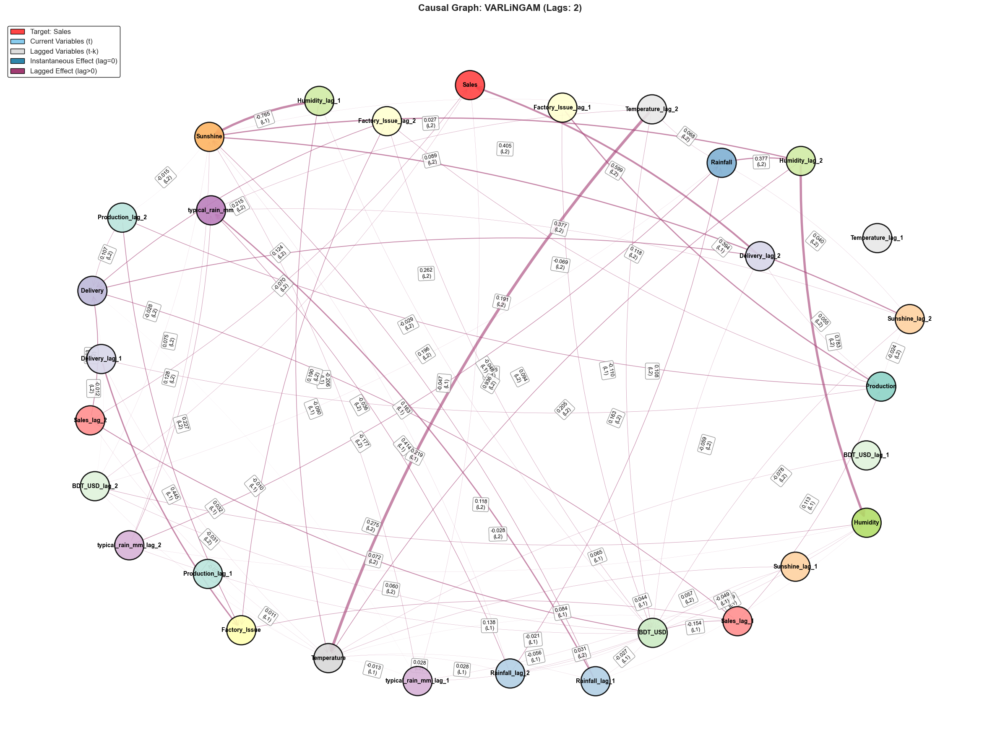


PREPARING ADJACENCY DATA
Adjacency matrix created:
  - Total edges: 77
  - Instantaneous edges: 0
  - Lagged edges: 77

Top 10 strongest connections:
             Source          Target    Weight  Lag Edge_Type
  Temperature_lag_2     Temperature  0.936354    2    lagged
     Humidity_lag_2        Humidity  0.783303    2    lagged
     Humidity_lag_1        Sunshine -0.765162    1    lagged
     Delivery_lag_2           Sales  0.598839    2    lagged
     Delivery_lag_1   Factory_Issue  0.445256    1    lagged
     Rainfall_lag_1 typical_rain_mm  0.413932    1    lagged
     Humidity_lag_2        Sunshine  0.404837    2    lagged
Factory_Issue_lag_1      Production  0.393651    1    lagged
     Sunshine_lag_2        Sunshine  0.377153    2    lagged
     Humidity_lag_2        Rainfall  0.376861    2    lagged


CAUSES OF 'Sales'
Total direct causes: 4

Top 20 causes:
               Source Target    Weight  Lag Edge_Type
       Delivery_lag_2  Sales  0.598839    2    lagged
          S

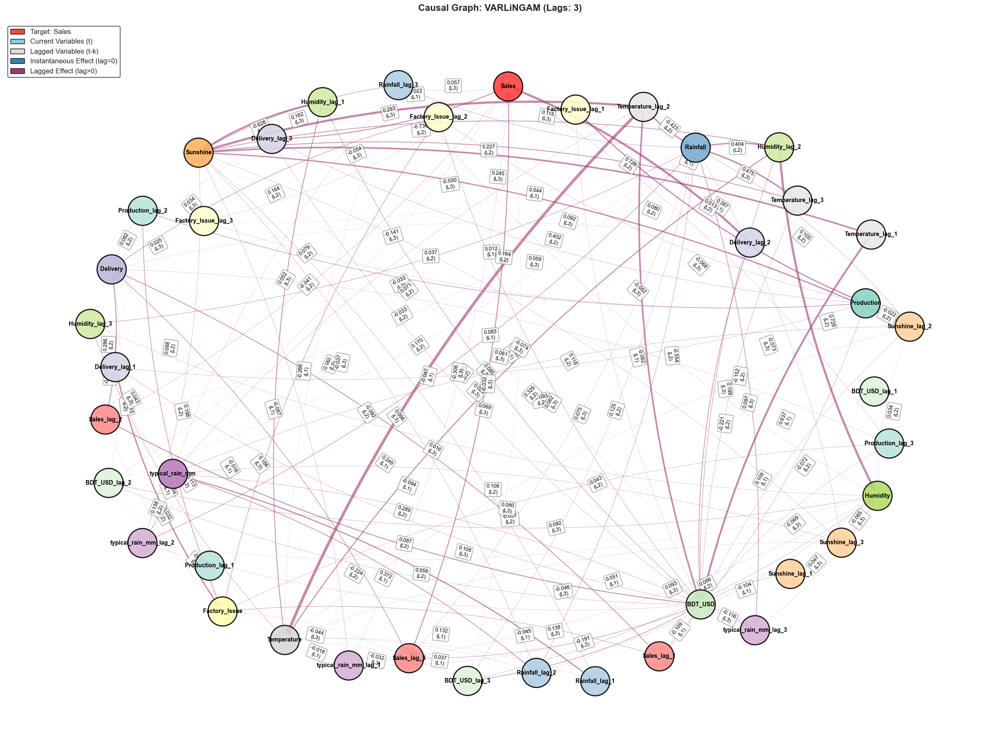


PREPARING ADJACENCY DATA
Adjacency matrix created:
  - Total edges: 125
  - Instantaneous edges: 0
  - Lagged edges: 125

Top 10 strongest connections:
           Source        Target    Weight  Lag Edge_Type
Temperature_lag_2   Temperature  0.958391    2    lagged
Temperature_lag_2      Sunshine -0.735536    2    lagged
   Humidity_lag_2      Humidity  0.727583    2    lagged
   Delivery_lag_2         Sales  0.725651    2    lagged
Temperature_lag_1       BDT_USD  0.637002    1    lagged
   Humidity_lag_1      Sunshine -0.625914    1    lagged
Temperature_lag_2       BDT_USD -0.554375    2    lagged
Temperature_lag_1      Sunshine  0.543651    1    lagged
Temperature_lag_3      Rainfall  0.474766    3    lagged
   Delivery_lag_1 Factory_Issue  0.434264    1    lagged


CAUSES OF 'Sales'
Total direct causes: 13

Top 20 causes:
               Source Target    Weight  Lag Edge_Type
       Delivery_lag_2  Sales  0.725651    2    lagged
          Sales_lag_3  Sales -0.306093    3    lagge

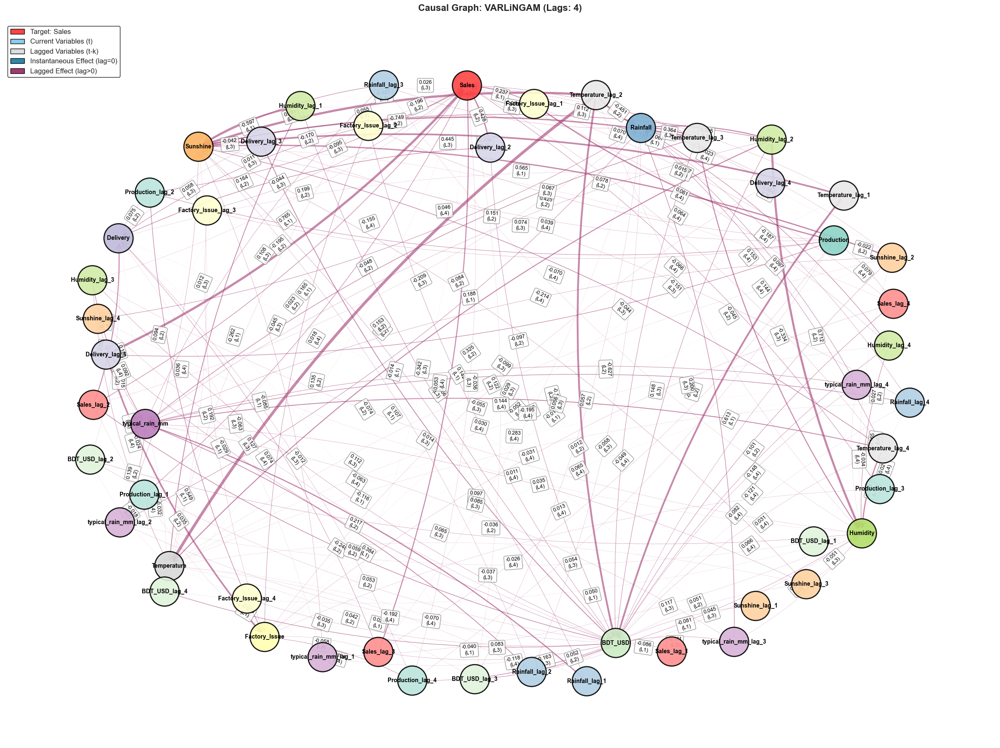


PREPARING ADJACENCY DATA
Adjacency matrix created:
  - Total edges: 183
  - Instantaneous edges: 0
  - Lagged edges: 183

Top 10 strongest connections:
           Source        Target    Weight  Lag Edge_Type
Temperature_lag_2   Temperature  0.957501    2    lagged
   Delivery_lag_1         Sales  0.765045    1    lagged
Temperature_lag_2      Sunshine -0.748785    2    lagged
   Humidity_lag_2      Humidity  0.712012    2    lagged
Temperature_lag_2       BDT_USD -0.626632    2    lagged
Temperature_lag_1       BDT_USD  0.612905    1    lagged
   Humidity_lag_1      Sunshine -0.596758    1    lagged
Temperature_lag_1      Sunshine  0.564626    1    lagged
   Delivery_lag_1 Factory_Issue  0.548759    1    lagged
Temperature_lag_2      Rainfall -0.451274    2    lagged


CAUSES OF 'Sales'
Total direct causes: 26

Top 20 causes:
             Source Target    Weight  Lag Edge_Type
     Delivery_lag_1  Sales  0.765045    1    lagged
     Delivery_lag_2  Sales  0.427756    2    lagged
    

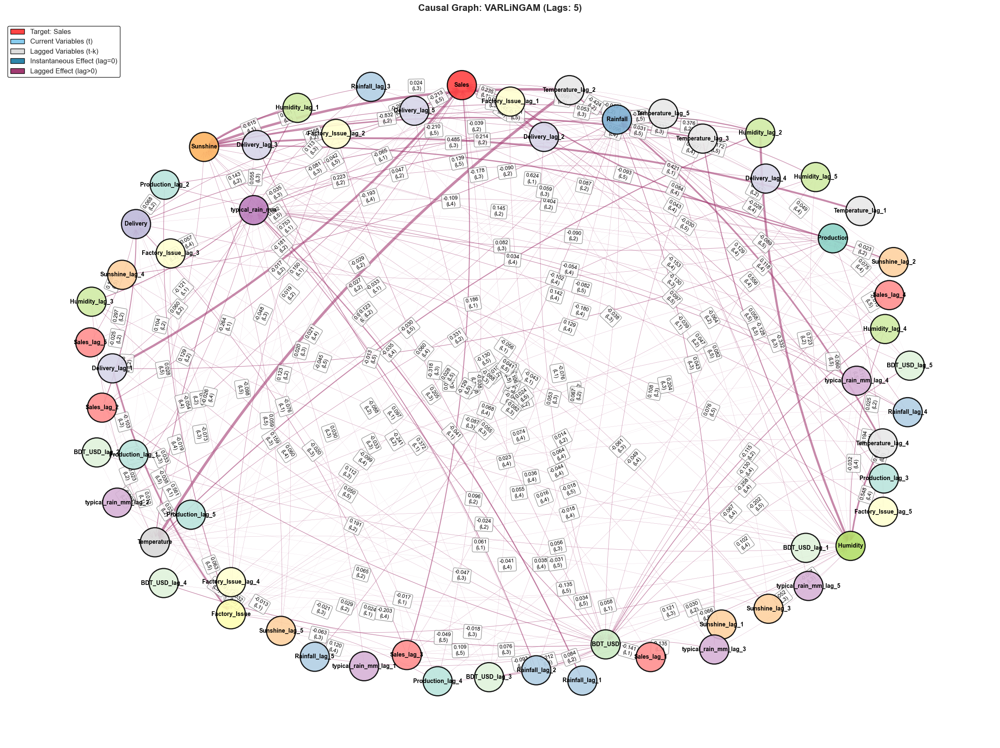


PREPARING ADJACENCY DATA
Adjacency matrix created:
  - Total edges: 251
  - Instantaneous edges: 0
  - Lagged edges: 251

Top 10 strongest connections:
           Source        Target    Weight  Lag Edge_Type
Temperature_lag_2   Temperature  0.916429    2    lagged
Temperature_lag_2      Sunshine -0.831691    2    lagged
   Delivery_lag_1         Sales  0.753068    1    lagged
   Humidity_lag_2      Humidity  0.723252    2    lagged
Temperature_lag_1      Sunshine  0.624443    1    lagged
   Humidity_lag_1      Sunshine -0.615409    1    lagged
   Delivery_lag_1 Factory_Issue  0.561407    1    lagged
Temperature_lag_4      Rainfall  0.556391    4    lagged
Temperature_lag_4      Humidity  0.547674    4    lagged
Temperature_lag_3      Sunshine  0.484672    3    lagged


CAUSES OF 'Sales'
Total direct causes: 30

Top 20 causes:
             Source Target    Weight  Lag Edge_Type
     Delivery_lag_1  Sales  0.753068    1    lagged
     Delivery_lag_2  Sales  0.454064    2    lagged
    

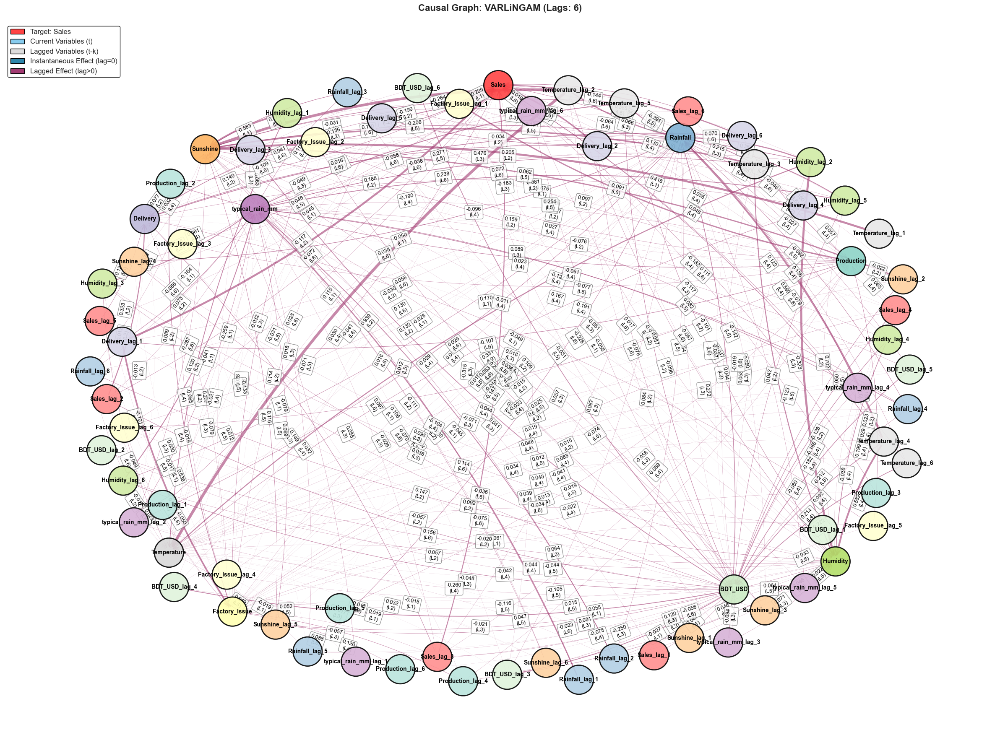


PREPARING ADJACENCY DATA
Adjacency matrix created:
  - Total edges: 302
  - Instantaneous edges: 0
  - Lagged edges: 302

Top 10 strongest connections:
           Source        Target    Weight  Lag Edge_Type
Temperature_lag_2   Temperature  0.939130    2    lagged
Temperature_lag_2      Sunshine -0.884309    2    lagged
   Humidity_lag_2      Humidity  0.702475    2    lagged
Temperature_lag_1      Sunshine  0.675207    1    lagged
   Delivery_lag_1         Sales  0.645386    1    lagged
Temperature_lag_4      Rainfall  0.599304    4    lagged
   Humidity_lag_1      Sunshine -0.582616    1    lagged
Temperature_lag_4      Humidity  0.582227    4    lagged
   Delivery_lag_1 Factory_Issue  0.536047    1    lagged
Temperature_lag_3      Sunshine  0.476166    3    lagged


CAUSES OF 'Sales'
Total direct causes: 29

Top 20 causes:
             Source Target    Weight  Lag Edge_Type
     Delivery_lag_1  Sales  0.645386    1    lagged
     Delivery_lag_2  Sales  0.464495    2    lagged
    

In [17]:
# Generate causal graph

lags = 5

for lag in range(1, lags+1):
    causal_graph, graph_info = generate_causal_graph_VARLiNGAM(
        df_merged, 
        lag=lag,
        target_col='Sales'
    )
    # Visualize and get adjacency data
    df_adjacency, json_adjacency = visualize_causal_graph(
        causal_graph, 
        graph_info,
        target_col='Sales',
        figsize=(24, 18),
        node_size=2500,
        font_size=10,
        edge_width_scale=5,
        edge_label_size=9,
        weight_threshold=0.01,  # Only show edges with |weight| > 0.01
        layout='spring',  # or 'hierarchical', 'circular', 'kamada_kawai'
        show_edge_weights=True,
        save_path='causal_graph.png'  # Optional: save to file
    )

    # Analyze target causes
    target_causes = analyze_target_causes(df_adjacency, target_col='Sales', top_n=20)

    # Export to files
    export_adjacency_to_csv(df_adjacency, f'../causality/adjacency_matrix_{lag}.csv')
    export_adjacency_to_json(json_adjacency, f'../causality/adjacency_matrix_{lag}.json')

## Load the JSON file and Visualize the Graph

In [18]:
def load_causal_graph_from_json(json_path, target_col='Sales'):
    """
    Load causal graph from adjacency matrix JSON file and reconstruct NetworkX graph.
    
    Parameters:
    -----------
    json_path : str
        Path to the adjacency_matrix.json file
    target_col : str, default='Sales'
        The target variable name
    
    Returns:
    --------
    nx.DiGraph
        Reconstructed directed graph
    dict
        Reconstructed graph information dictionary
    """
    
    import json
    
    print(f"\n{'='*60}")
    print(f"LOADING CAUSAL GRAPH FROM JSON")
    print(f"{'='*60}")
    print(f"File: {json_path}")
    
    # Load JSON data
    with open(json_path, 'r') as f:
        adjacency_data = json.load(f)
    
    print(f"Loaded {len(adjacency_data)} edges from JSON")
    
    # =========================================================================
    # STEP 1: EXTRACT ALL UNIQUE NODES
    # =========================================================================
    all_nodes = set()
    current_nodes = set()
    lagged_nodes = set()
    
    for edge in adjacency_data:
        source = edge['Source']
        target = edge['Target']
        
        all_nodes.add(source)
        all_nodes.add(target)
        
        # Classify nodes
        if '_lag_' in source:
            lagged_nodes.add(source)
        else:
            current_nodes.add(source)
        
        if '_lag_' in target:
            lagged_nodes.add(target)
        else:
            current_nodes.add(target)
    
    print(f"\nExtracted nodes:")
    print(f"  - Total nodes: {len(all_nodes)}")
    print(f"  - Current nodes: {len(current_nodes)}")
    print(f"  - Lagged nodes: {len(lagged_nodes)}")
    
    # =========================================================================
    # STEP 2: DETERMINE VARIABLES AND LAGS
    # =========================================================================
    # Extract base variable names (without lag suffix)
    variables = set()
    max_lag = 0
    
    for node in all_nodes:
        if '_lag_' in node:
            var_name, lag_str = node.rsplit('_lag_', 1)
            variables.add(var_name)
            lag = int(lag_str)
            max_lag = max(max_lag, lag)
        else:
            variables.add(node)
    
    variables = sorted(list(variables))
    
    print(f"\nVariables: {len(variables)}")
    print(f"  {variables}")
    print(f"Maximum lag: {max_lag}")
    
    # =========================================================================
    # STEP 3: BUILD NETWORKX GRAPH
    # =========================================================================
    G = nx.DiGraph()
    
    # Add nodes with attributes
    for node in current_nodes:
        G.add_node(node, node_type='current', time='t')
    
    for node in lagged_nodes:
        lag = int(node.rsplit('_lag_', 1)[1])
        G.add_node(node, node_type='lagged', time=f't-{lag}')
    
    # Add edges with attributes
    for edge in adjacency_data:
        G.add_edge(
            edge['Source'],
            edge['Target'],
            weight=edge['Weight'],
            lag=edge['Lag'],
            edge_type=edge.get('Edge_Type', 'unknown')
        )
    
    print(f"\nGraph reconstructed:")
    print(f"  - Nodes: {G.number_of_nodes()}")
    print(f"  - Edges: {G.number_of_edges()}")
    
    # =========================================================================
    # STEP 4: ANALYZE EDGE TYPES
    # =========================================================================
    instantaneous_edges = [e for e in adjacency_data if e['Lag'] == 0]
    lagged_edges = [e for e in adjacency_data if e['Lag'] > 0]
    
    print(f"  - Instantaneous edges: {len(instantaneous_edges)}")
    print(f"  - Lagged edges: {len(lagged_edges)}")
    
    # =========================================================================
    # STEP 5: ANALYZE TARGET VARIABLE
    # =========================================================================
    target_edges = [e for e in adjacency_data if e['Target'] == target_col]
    target_edges_sorted = sorted(target_edges, 
                                 key=lambda x: abs(x['Weight']), 
                                 reverse=True)
    
    print(f"\nTarget variable '{target_col}':")
    print(f"  - Direct causes: {len(target_edges)}")
    print(f"  - Top 5 causes:")
    for i, edge in enumerate(target_edges_sorted[:5]):
        print(f"    {i+1}. {edge['Source']:20s} -> {edge['Target']:10s} | "
              f"weight: {edge['Weight']:7.4f} | lag: {edge['Lag']}")
    
    # =========================================================================
    # STEP 6: CONSTRUCT GRAPH INFO DICTIONARY
    # =========================================================================
    # Convert target edges to tuple format expected by visualization
    target_edges_tuples = [
        (e['Source'], e['Target'], {
            'weight': e['Weight'], 
            'lag': e['Lag'],
            'edge_type': e.get('Edge_Type', 'unknown')
        })
        for e in target_edges_sorted
    ]
    
    graph_info = {
        'method': 'VARLiNGAM',
        'requested_lag': max_lag,
        'actual_n_lags': max_lag,
        'criterion': 'loaded_from_json',
        'target_col': target_col,
        'n_variables': len(variables),
        'n_nodes': G.number_of_nodes(),
        'n_edges': G.number_of_edges(),
        'n_lagged_edges': len(lagged_edges),
        'n_instantaneous_edges': len(instantaneous_edges),
        'variables': variables,
        'causal_order': None,  # Not stored in JSON
        'target_causes': target_edges_tuples,
        'removed_low_variance': [],
        'removed_high_correlation': []
    }
    
    print(f"{'='*60}\n")
    
    return G, graph_info


def load_and_visualize_from_json(json_path, 
                                  target_col='Sales',
                                  figsize=(20, 16),
                                  node_size=2000,
                                  font_size=10,
                                  edge_width_scale=3,
                                  edge_label_size=8,
                                  weight_threshold=0.0,
                                  layout='spring',
                                  show_edge_weights=True,
                                  save_path=None):
    """
    Load causal graph from JSON and visualize it in one step.
    
    Parameters:
    -----------
    json_path : str
        Path to the adjacency_matrix.json file
    target_col : str, default='Sales'
        The target variable name
    (other parameters same as visualize_causal_graph)
    
    Returns:
    --------
    nx.DiGraph
        Reconstructed directed graph
    dict
        Reconstructed graph information dictionary
    pd.DataFrame
        Adjacency matrix as DataFrame
    dict
        Adjacency matrix as JSON
    """
    
    # Load graph from JSON
    G, graph_info = load_causal_graph_from_json(json_path, target_col)
    
    # Visualize
    df_adjacency, json_adjacency = visualize_causal_graph(
        G, graph_info,
        target_col=target_col,
        figsize=figsize,
        node_size=node_size,
        font_size=font_size,
        edge_width_scale=edge_width_scale,
        edge_label_size=edge_label_size,
        weight_threshold=weight_threshold,
        layout=layout,
        show_edge_weights=show_edge_weights,
        save_path=save_path
    )
    
    return G, graph_info, df_adjacency, json_adjacency


def compare_multiple_graphs_from_json(json_paths, labels, target_col='Sales', 
                                       figsize=(24, 8), node_size=1500, 
                                       font_size=8, edge_width_scale=2):
    """
    Load and compare multiple causal graphs side by side.
    
    Parameters:
    -----------
    json_paths : list of str
        List of paths to adjacency_matrix.json files
    labels : list of str
        Labels for each graph (e.g., ['Lag 1', 'Lag 2', 'Lag 3'])
    target_col : str
        Target variable name
    (other parameters same as visualize_causal_graph)
    
    Returns:
    --------
    list of tuples
        [(G, graph_info, df_adjacency, json_adjacency), ...] for each graph
    """
    
    n_graphs = len(json_paths)
    fig, axes = plt.subplots(1, n_graphs, figsize=(figsize[0], figsize[1]))
    
    if n_graphs == 1:
        axes = [axes]
    
    results = []
    
    for idx, (json_path, label) in enumerate(zip(json_paths, labels)):
        print(f"\n{'='*60}")
        print(f"Loading Graph {idx+1}/{n_graphs}: {label}")
        print(f"{'='*60}")
        
        # Load graph
        G, graph_info = load_causal_graph_from_json(json_path, target_col)
        
        # Create adjacency data for return
        adjacency_data = []
        for u, v, d in G.edges(data=True):
            adjacency_data.append({
                'Source': u,
                'Target': v,
                'Weight': d.get('weight', 0),
                'Lag': d.get('lag', 0),
                'Edge_Type': d.get('edge_type', 'unknown')
            })
        
        df_adjacency = pd.DataFrame(adjacency_data)
        json_adjacency = df_adjacency.to_dict(orient='records')
        
        results.append((G, graph_info, df_adjacency, json_adjacency))
        
        # TODO: Add visualization to subplot axes[idx]
        # This would require modifying visualize_causal_graph to accept an axis parameter
        print(f"Graph {idx+1} loaded: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")
    
    plt.tight_layout()
    plt.show()
    
    return results


LOADING CAUSAL GRAPH FROM JSON
File: ../causality/adjacency_matrix_1.json
Loaded 77 edges from JSON

Extracted nodes:
  - Total nodes: 29
  - Current nodes: 10
  - Lagged nodes: 19

Variables: 10
  ['BDT_USD', 'Delivery', 'Factory_Issue', 'Humidity', 'Production', 'Rainfall', 'Sales', 'Sunshine', 'Temperature', 'typical_rain_mm']
Maximum lag: 2

Graph reconstructed:
  - Nodes: 29
  - Edges: 77
  - Instantaneous edges: 0
  - Lagged edges: 77

Target variable 'Sales':
  - Direct causes: 4
  - Top 5 causes:
    1. Delivery_lag_2       -> Sales      | weight:  0.5988 | lag: 2
    2. Sales_lag_2          -> Sales      | weight:  0.1243 | lag: 2
    3. BDT_USD_lag_2        -> Sales      | weight: -0.0702 | lag: 2
    4. typical_rain_mm_lag_1 -> Sales      | weight: -0.0472 | lag: 1


VISUALIZING CAUSAL GRAPH
Edges: 77 (filtered from 77 with threshold=0.0)
Nodes: 29
  - Current nodes: 10
  - Lagged nodes: 19

Computing layout: spring


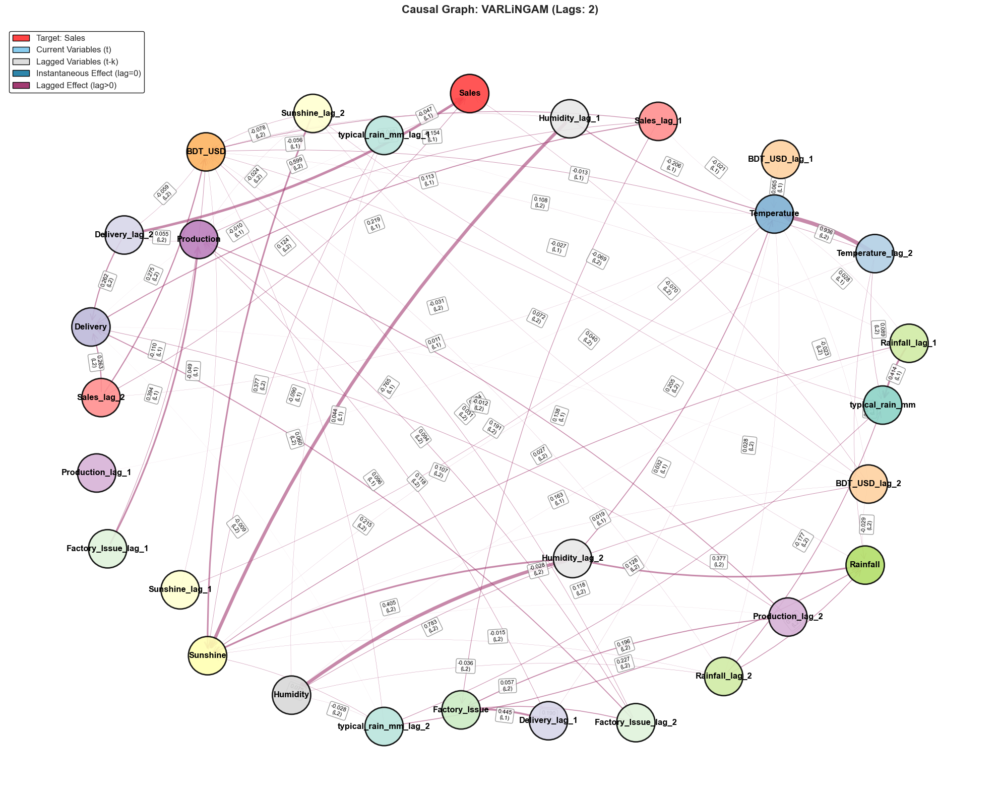


PREPARING ADJACENCY DATA
Adjacency matrix created:
  - Total edges: 77
  - Instantaneous edges: 0
  - Lagged edges: 77

Top 10 strongest connections:
             Source          Target    Weight  Lag Edge_Type
  Temperature_lag_2     Temperature  0.936354    2    lagged
     Humidity_lag_2        Humidity  0.783303    2    lagged
     Humidity_lag_1        Sunshine -0.765162    1    lagged
     Delivery_lag_2           Sales  0.598839    2    lagged
     Delivery_lag_1   Factory_Issue  0.445256    1    lagged
     Rainfall_lag_1 typical_rain_mm  0.413932    1    lagged
     Humidity_lag_2        Sunshine  0.404837    2    lagged
Factory_Issue_lag_1      Production  0.393651    1    lagged
     Sunshine_lag_2        Sunshine  0.377153    2    lagged
     Humidity_lag_2        Rainfall  0.376861    2    lagged



In [19]:
lag = 1

# Load graph structure
G, graph_info = load_causal_graph_from_json(f'../causality/adjacency_matrix_{lag}.json', target_col='Sales')

# Visualize with custom settings
df_adjacency, json_adjacency = visualize_causal_graph(
    G, graph_info,
    target_col='Sales',
    node_size=3000,
    font_size=12,
    edge_width_scale=6,
    layout='spring'  # Try different layout
)

## Compare Different Models


LOADING CAUSAL GRAPH FROM JSON
File: ../causality/adjacency_matrix_1.json
Loaded 77 edges from JSON

Extracted nodes:
  - Total nodes: 29
  - Current nodes: 10
  - Lagged nodes: 19

Variables: 10
  ['BDT_USD', 'Delivery', 'Factory_Issue', 'Humidity', 'Production', 'Rainfall', 'Sales', 'Sunshine', 'Temperature', 'typical_rain_mm']
Maximum lag: 2

Graph reconstructed:
  - Nodes: 29
  - Edges: 77
  - Instantaneous edges: 0
  - Lagged edges: 77

Target variable 'Sales':
  - Direct causes: 4
  - Top 5 causes:
    1. Delivery_lag_2       -> Sales      | weight:  0.5988 | lag: 2
    2. Sales_lag_2          -> Sales      | weight:  0.1243 | lag: 2
    3. BDT_USD_lag_2        -> Sales      | weight: -0.0702 | lag: 2
    4. typical_rain_mm_lag_1 -> Sales      | weight: -0.0472 | lag: 1


VISUALIZING CAUSAL GRAPH
Edges: 77 (filtered from 77 with threshold=0.0)
Nodes: 29
  - Current nodes: 10
  - Lagged nodes: 19

Computing layout: spring

Figure saved to: graph_spring.png


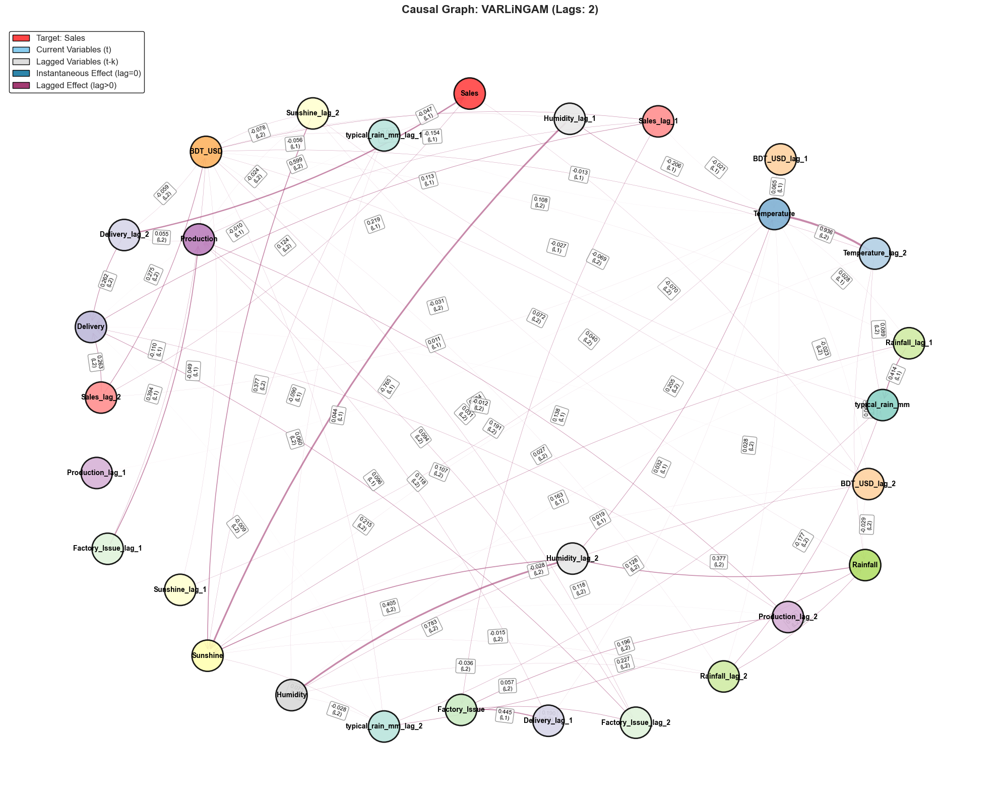


PREPARING ADJACENCY DATA
Adjacency matrix created:
  - Total edges: 77
  - Instantaneous edges: 0
  - Lagged edges: 77

Top 10 strongest connections:
             Source          Target    Weight  Lag Edge_Type
  Temperature_lag_2     Temperature  0.936354    2    lagged
     Humidity_lag_2        Humidity  0.783303    2    lagged
     Humidity_lag_1        Sunshine -0.765162    1    lagged
     Delivery_lag_2           Sales  0.598839    2    lagged
     Delivery_lag_1   Factory_Issue  0.445256    1    lagged
     Rainfall_lag_1 typical_rain_mm  0.413932    1    lagged
     Humidity_lag_2        Sunshine  0.404837    2    lagged
Factory_Issue_lag_1      Production  0.393651    1    lagged
     Sunshine_lag_2        Sunshine  0.377153    2    lagged
     Humidity_lag_2        Rainfall  0.376861    2    lagged


VISUALIZING CAUSAL GRAPH
Edges: 77 (filtered from 77 with threshold=0.0)
Nodes: 29
  - Current nodes: 10
  - Lagged nodes: 19

Computing layout: hierarchical

Figure saved to: 

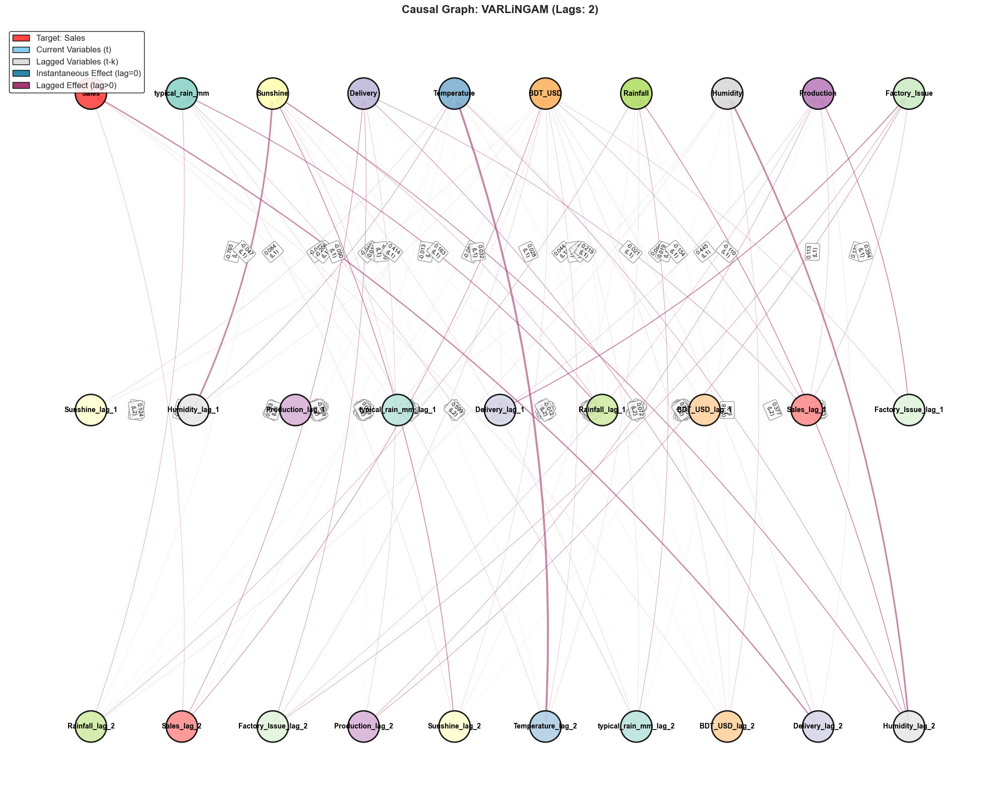


PREPARING ADJACENCY DATA
Adjacency matrix created:
  - Total edges: 77
  - Instantaneous edges: 0
  - Lagged edges: 77

Top 10 strongest connections:
             Source          Target    Weight  Lag Edge_Type
  Temperature_lag_2     Temperature  0.936354    2    lagged
     Humidity_lag_2        Humidity  0.783303    2    lagged
     Humidity_lag_1        Sunshine -0.765162    1    lagged
     Delivery_lag_2           Sales  0.598839    2    lagged
     Delivery_lag_1   Factory_Issue  0.445256    1    lagged
     Rainfall_lag_1 typical_rain_mm  0.413932    1    lagged
     Humidity_lag_2        Sunshine  0.404837    2    lagged
Factory_Issue_lag_1      Production  0.393651    1    lagged
     Sunshine_lag_2        Sunshine  0.377153    2    lagged
     Humidity_lag_2        Rainfall  0.376861    2    lagged


VISUALIZING CAUSAL GRAPH
Edges: 77 (filtered from 77 with threshold=0.0)
Nodes: 29
  - Current nodes: 10
  - Lagged nodes: 19

Computing layout: circular

Figure saved to: grap

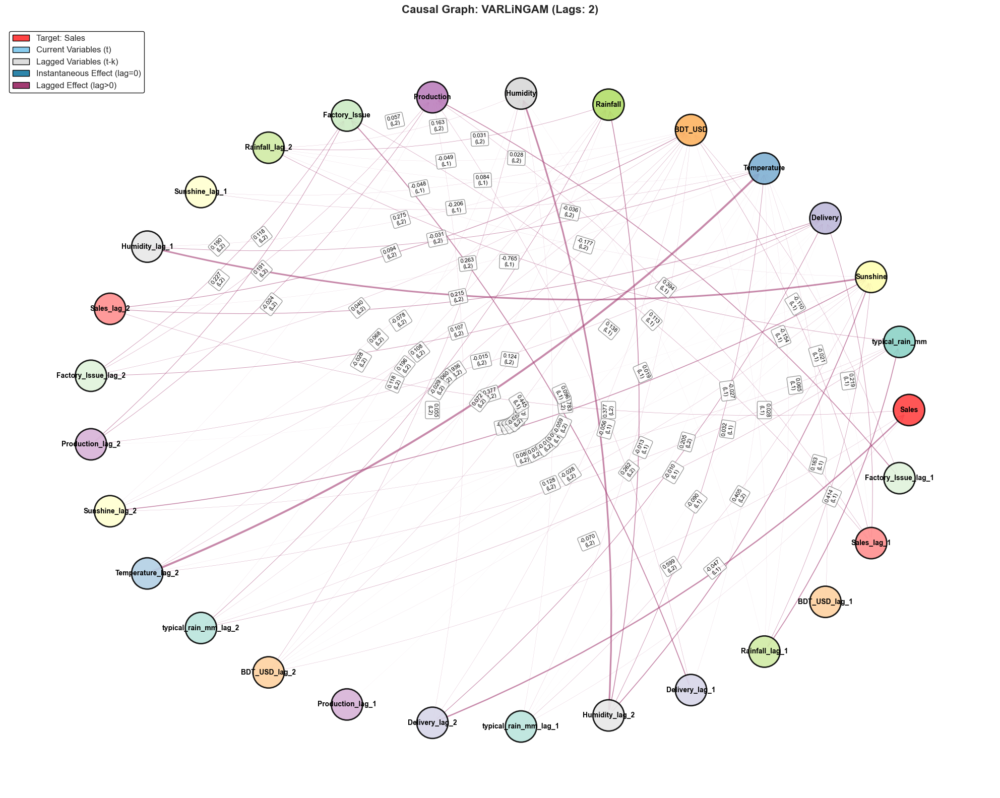


PREPARING ADJACENCY DATA
Adjacency matrix created:
  - Total edges: 77
  - Instantaneous edges: 0
  - Lagged edges: 77

Top 10 strongest connections:
             Source          Target    Weight  Lag Edge_Type
  Temperature_lag_2     Temperature  0.936354    2    lagged
     Humidity_lag_2        Humidity  0.783303    2    lagged
     Humidity_lag_1        Sunshine -0.765162    1    lagged
     Delivery_lag_2           Sales  0.598839    2    lagged
     Delivery_lag_1   Factory_Issue  0.445256    1    lagged
     Rainfall_lag_1 typical_rain_mm  0.413932    1    lagged
     Humidity_lag_2        Sunshine  0.404837    2    lagged
Factory_Issue_lag_1      Production  0.393651    1    lagged
     Sunshine_lag_2        Sunshine  0.377153    2    lagged
     Humidity_lag_2        Rainfall  0.376861    2    lagged


VISUALIZING CAUSAL GRAPH
Edges: 77 (filtered from 77 with threshold=0.0)
Nodes: 29
  - Current nodes: 10
  - Lagged nodes: 19

Computing layout: kamada_kawai

Figure saved to: 

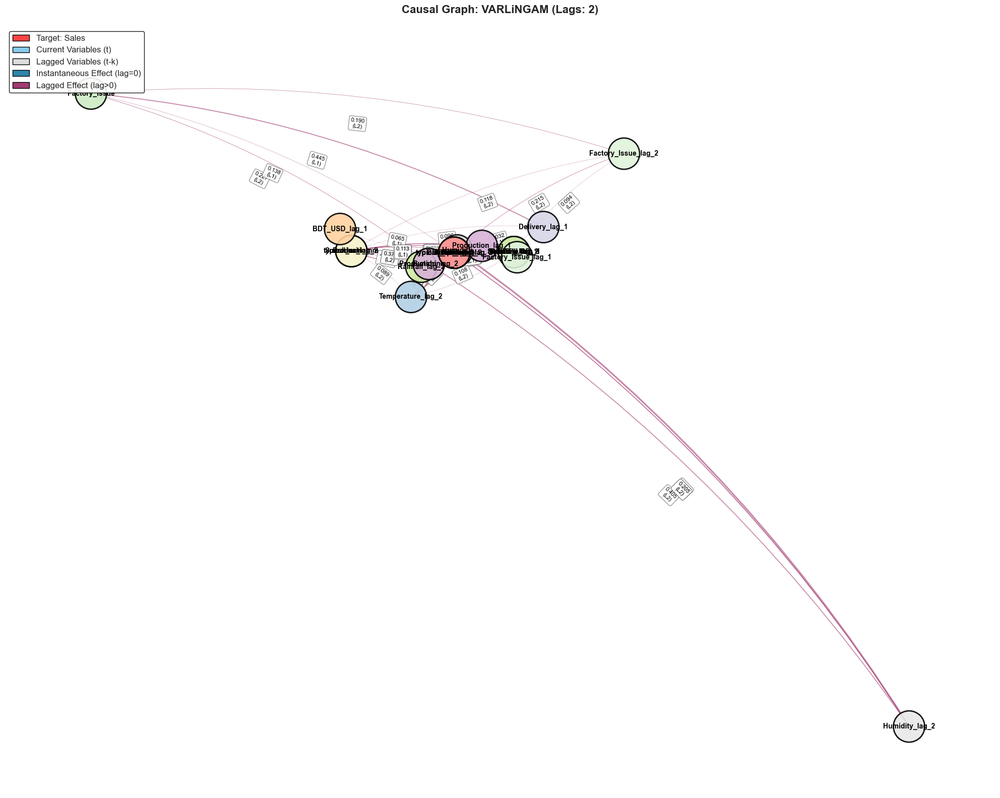


PREPARING ADJACENCY DATA
Adjacency matrix created:
  - Total edges: 77
  - Instantaneous edges: 0
  - Lagged edges: 77

Top 10 strongest connections:
             Source          Target    Weight  Lag Edge_Type
  Temperature_lag_2     Temperature  0.936354    2    lagged
     Humidity_lag_2        Humidity  0.783303    2    lagged
     Humidity_lag_1        Sunshine -0.765162    1    lagged
     Delivery_lag_2           Sales  0.598839    2    lagged
     Delivery_lag_1   Factory_Issue  0.445256    1    lagged
     Rainfall_lag_1 typical_rain_mm  0.413932    1    lagged
     Humidity_lag_2        Sunshine  0.404837    2    lagged
Factory_Issue_lag_1      Production  0.393651    1    lagged
     Sunshine_lag_2        Sunshine  0.377153    2    lagged
     Humidity_lag_2        Rainfall  0.376861    2    lagged



In [20]:
# Load once
G, graph_info = load_causal_graph_from_json('../causality/adjacency_matrix_1.json')

# Create different visualizations
layouts = ['spring', 'hierarchical', 'circular', 'kamada_kawai']
for layout in layouts:
    visualize_causal_graph(
        G, graph_info,
        target_col='Sales',
        layout=layout,
        save_path=f'graph_{layout}.png'
    )